In [ ]:
!pip install statannot
!pip install scikit-optimize
!pip install shap


import shap
import xgboost as xgb
from sklearn.model_selection import train_test_split

from __future__ import division
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBClassifier
import pandas as pd
import numpy as np
import re
import pickle
import matplotlib.pyplot as plt
from xgboost import plot_importance
import plotly.graph_objects as go
from tqdm.notebook import tqdm
from sklearn.model_selection import RepeatedKFold
import xgboost as xgb
from sklearn.metrics import roc_auc_score, roc_curve, f1_score, accuracy_score, recall_score, precision_score, confusion_matrix, mean_squared_error
import seaborn as sns
from statannot import add_stat_annotation
from sklearn.linear_model import Lasso, MultiTaskLasso, Ridge, ElasticNet

from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.feature_selection import mutual_info_regression, f_regression

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedKFold
from sklearn.decomposition import PCA

from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler

from sklearn import metrics


from skopt import BayesSearchCV
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNet

import statsmodels.api as sm

import time

import scipy

from sklearn.svm import SVR

from skopt import BayesSearchCV
from sklearn.ensemble import RandomForestRegressor

from statsmodels.stats.multitest import fdrcorrection

from statsmodels.stats import multitest

from sklearn.linear_model import RidgeCV, LassoCV, Ridge, Lasso
from sklearn.ensemble import ExtraTreesClassifier

from collections import Counter
import heapq

import statsmodels.api as sm

from sklearn.ensemble import RandomForestRegressor

import re

from sklearn.preprocessing import MinMaxScaler

import os

import pandas as pd
from sklearn.utils import resample
from sklearn.cluster import KMeans

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 6.1 MB/s eta 0:00:00


In [ ]:
from scipy.stats import linregress, combine_pvalues
from sklearn.model_selection import train_test_split, RepeatedKFold
import xgboost as xgb
import numpy as np
import pandas as pd
import plotly.graph_objs as go
from tqdm import tqdm

def classifier_ROC(X_, y, diagnosis, fig_show=True, params_=None):


    X_train, X_test, y_train, y_test = train_test_split(X_, y, test_size=0.2, random_state=6000, stratify=diagnosis)


    n_splits=7 #10
    n_repeats=10#2

    cv = RepeatedKFold(n_splits=n_splits, n_repeats=n_repeats, random_state=101)
    folds = [(train, test) for train, test in cv.split(X_train, y_train)]
    metrics = ['auc', 'fpr', 'tpr', 'thresholds', 'f1_score', 'accuracy_score', 'recall_score', 'precision_score', 'confusion_matrix', 'model']
    results = {
        'train': {m: [] for m in metrics},
        'val': {m: [] for m in metrics},
        'test': {m: [] for m in metrics}
    }
    X_train = pd.DataFrame(X_train)
    y_train = pd.DataFrame(y_train)


    if params_ is not None:
        params = params_
    else:
        params = {
            'objective': 'binary:logistic',
            'eval_metric': 'logloss',
            #'max_depth': 5,
            #'learning_rate': 0.1,
            #'subsample': 0.8,
            #'lambda': 1,
            #'alpha': 0,
            #'tree_method': 'hist',
            #'device': 'cuda'
            }

    plt.rcParams["figure.figsize"] = (10, 10)
    dtest = xgb.DMatrix(X_test, label=y_test)

    all_p_values = {feature: [] for feature in X_train.columns}
    slopes = {feature: [] for feature in X_train.columns}
    correlations = {feature: [] for feature in X_train.columns}
    intercepts = {feature: [] for feature in X_train.columns}
    directions = {feature: [] for feature in X_train.columns}
    r_squared = {feature: [] for feature in X_train.columns}
    t_values = {feature: [] for feature in X_train.columns}
    f_values = {feature: [] for feature in X_train.columns}
    f_p_values = {feature: [] for feature in X_train.columns}
    r_values = {feature: [] for feature in X_train.columns}
    cohen_f2_values = {feature: [] for feature in X_train.columns}


    p_values_per_iteration = {feature: [] for feature in X_train.columns}

    for train_idx, test_idx in tqdm(folds, total=len(folds)):
        dtrain = xgb.DMatrix(X_train.iloc[train_idx, :], label=y_train.iloc[train_idx])
        dval = xgb.DMatrix(X_train.iloc[test_idx, :], label=y_train.iloc[test_idx])
        model = xgb.train(
            dtrain=dtrain,
            params=params,
            evals=[(dtrain, 'train'), (dval, 'val')],
            num_boost_round=1000,
            verbose_eval=False,
            early_stopping_rounds=10,
        )
        last_model = model
        sets = [dtrain, dval, dtest]

        for i, ds in enumerate(results.keys()):
            y_preds = model.predict(sets[i])
            labels = sets[i].get_label()
            fpr, tpr, thresholds = roc_curve(labels, y_preds)
            results[ds]['fpr'].append(fpr)
            results[ds]['tpr'].append(tpr)
            results[ds]['thresholds'].append(thresholds)
            results[ds]['auc'].append(roc_auc_score(labels, y_preds))

            results[ds]['f1_score'].append(f1_score(labels, np.round(y_preds)))
            results[ds]['accuracy_score'].append(accuracy_score(labels, np.round(y_preds)))
            results[ds]['recall_score'].append(recall_score(labels, np.round(y_preds)))
            results[ds]['precision_score'].append(precision_score(labels, np.round(y_preds)))
            results[ds]['confusion_matrix'].append(confusion_matrix(labels, np.round(y_preds)))
            results[ds]['model'].append(model)

        for feature in X_train.columns:
            X_feature = X_train[feature].iloc[train_idx].values
            y_train_squeezed = y_train.iloc[train_idx].squeeze().values

            if len(X_feature) == len(y_train_squeezed):
                slope, intercept, r_value, p_value, std_err = linregress(X_feature, y_train_squeezed)
                all_p_values[feature].append(p_value)



                slopes[feature].append(slope)
                correlations[feature].append(r_value)
                intercepts[feature].append(intercept)

                directions[feature].append(1 if slope > 0 else -1)


                aux=r_value**2
                r_squared[feature].append(aux)

                r_values[feature].append(r_value)

                cohen_f2 = (aux / (1 - aux))
                cohen_f2_values[feature].append(cohen_f2)


                X_feature_with_const = sm.add_constant(X_feature)
                model = sm.OLS(y_train_squeezed, X_feature_with_const).fit()


                t_values[feature].append(model.tvalues[1]) #
                f_values[feature].append(model.fvalue) #
                f_p_values[feature].append(model.f_pvalue) #



            else:
                print(f" {feature}: {len(X_feature)} vs {len(y_train_squeezed)}")



    combined_p = {feature: combine_pvalues(all_p_values[feature], method='fisher')[1] for feature in X_train.columns}



    average_slopes = {feature: np.mean([slope for slope in slopes[feature] if slope]) for feature in X_train.columns}

    average_correlations = {feature: np.mean([correlation for correlation in correlations[feature] if correlation]) for feature in correlations}



    average_directions = {}
    for feature in X_train.columns:
        avg_direction = np.mean(directions[feature])
        if avg_direction > 0:
            average_directions[feature] = 1
        else:
            average_directions[feature] = -1

    average_r_squared = {feature: np.mean([r2 for r2 in r_squared[feature] if r2]) for feature in X_train.columns}
    average_t_values = {feature: np.mean([t for t in t_values[feature] if t]) for feature in X_train.columns}
    average_f_values = {feature: np.mean([f for f in f_values[feature] if f]) for feature in X_train.columns}
    average_f_p_values = {feature: np.mean([fp for fp in f_p_values[feature] if fp]) for feature in X_train.columns}
    average_cohen_f2_values = {feature: np.mean([fp for fp in cohen_f2_values[feature] if fp]) for feature in X_train.columns}
    average_r_values = {feature: np.mean([r for r in r_values[feature] if r]) for feature in X_train.columns}



    kind = 'test'
    c_fill = 'rgba(52, 152, 219, 0.2)'
    c_line = 'rgba(52, 152, 219, 0.5)'
    c_line_main = 'rgba(41, 128, 185, 1.0)'
    c_grid = 'rgba(189, 195, 199, 0.5)'
    c_annot = 'rgba(149, 165, 166, 0.5)'
    c_highlight = 'rgba(192, 57, 43, 1.0)'

    fpr_mean = np.linspace(0, 1, 100)
    interp_tprs = []

    for i in range(n_splits * n_repeats):
        fpr = results[kind]['fpr'][i]
        tpr = results[kind]['tpr'][i]
        interp_tpr = np.interp(fpr_mean, fpr, tpr)
        interp_tpr[0] = 0.0
        interp_tprs.append(interp_tpr)

    tpr_mean = np.mean(interp_tprs, axis=0)
    tpr_mean[-1] = 1.0
    tpr_std = 2 * np.std(interp_tprs, axis=0)
    tpr_upper = np.clip(tpr_mean + tpr_std, 0, 1)
    tpr_lower = tpr_mean - tpr_std
    auc = np.mean(results[kind]['auc'])

    roc_dict = {}
    roc_dict['tpr_mean'] = tpr_mean
    roc_dict['tpr_std'] = tpr_std
    roc_dict['tpr_upper'] = tpr_upper
    roc_dict['tpr_lower'] = tpr_lower
    roc_dict['auc'] = auc


    results_ = {}
    results_[0] = model
    results_[1] = results
    results_[2] = np.round(auc, 2)
    results_[3] = roc_dict

    shap.initjs()

    dmatrix_full = xgb.DMatrix(X_, label=y)
    model_final = xgb.train(
        dtrain=dmatrix_full,
        params=params,
        num_boost_round=1000,
        verbose_eval=False
    )

    explainer = shap.TreeExplainer(model_final)
    shap_values = explainer.shap_values(X_)


    shap.summary_plot(shap_values, X_, plot_type="bar")

    dmatrix_test_full = xgb.DMatrix(X_test)
    shap_values_test = explainer.shap_values(X_test)
    shap.summary_plot(shap_values_test, X_test)


    shap_df = pd.DataFrame(shap_values, columns=X_.columns)
    shap_df['Predictions'] = model_final.predict(dmatrix_full)
    shap_df['Actual Labels'] = y
    print(shap_df.head())



    if isinstance(shap_values, list):
        for i in range(len(shap_values)):
            shap.summary_plot(shap_values[i], X_, plot_type="beeswarm", title=f"Class {i}")
    else:
        shap.summary_plot(shap_values, X_, plot_type="beeswarm")



    if fig_show:
        fig = go.Figure([
            go.Scatter(
                x=fpr_mean,
                y=tpr_upper,
                line=dict(color=c_line, width=1),
                hoverinfo="skip",
                showlegend=False,
                name='upper'),
            go.Scatter(
                x=fpr_mean,
                y=tpr_lower,
                fill='tonexty',
                fillcolor=c_fill,
                line=dict(color=c_line, width=1),
                hoverinfo="skip",
                showlegend=False,
                name='lower'),
            go.Scatter(
                x=fpr_mean,
                y=tpr_mean,
                line=dict(color=c_line_main, width=2),
                hoverinfo="skip",
                showlegend=True,
                name=f'AUC: {auc:.3f}')
        ])

        fig.add_shape(
            type='line',
            line=dict(dash='dash'),
            x0=0, x1=1, y0=0, y1=1
        )

        fig.update_layout(
            template='plotly_white',
            title_x=0.5,
            xaxis_title="1 - Specificity",
            yaxis_title="Sensitivity",
            width=800,
            height=800,
            legend=dict(
                yanchor="bottom",
                xanchor="right",
                x=0.95,
                y=0.01,
            )
        )

        fig.update_yaxes(
            range=[0, 1],
            gridcolor=c_grid,
            scaleanchor="x",
            scaleratio=1,
            linecolor='black')

        fig.update_xaxes(
            range=[0, 1],
            gridcolor=c_grid,
            constrain='domain',
            linecolor='black')

        fig.show()


    else:
        print(y.name, 'AUC: ', np.round(auc, 2), '+-( ', np.round(np.std(results[kind]['auc']), 2), ')', X_.shape)


    results = {}
    results['results_'] = results_

    results['combined_p'] = combined_p
    results['slopes'] = average_slopes
    results['directions'] = average_directions
    results['intercepts'] = intercepts  #
    results['correlations'] = average_correlations  #
    results['rsquared'] = average_r_squared  #
    results['fvalues'] = average_f_values  #
    results['fpvalues']=average_f_p_values
    results['cohenf2values']=average_cohen_f2_values
    results['average_r_values']=average_r_values
    results['slopes_todo']=slopes


    return results


In [ ]:
from skopt import BayesSearchCV
def SearchBestModel(case_x, case_y):

    X_train, X_test, y_train, y_test = train_test_split(case_x, case_y, test_size=.2, random_state=1)

    opt_XGB = BayesSearchCV(
            XGBClassifier(),#tree_method='hist',device='cuda'
            {
                'objective'   : ['binary:logistic'],
                'eval_metric' : ['logloss', 'error', 'auc', 'aucpr'],
                'learning_rate': (0.01, 0.1, 0.2),
                'max_depth': (3, 4, 5),
                'subsample': (0.7,0.8, 0.9, 1.0),
                'colsample_bytree': (0.7,0.8, 0.9, 1.0),
                'reg_alpha': (0, 0.1,0.5,1.0),
                'reg_lambda': (0, 0.1,0.5, 1.0),
                #'gamma': (0.001, 0.01, 0.1, 1, 10),
            },

            #n_iter=10,
            #cv=3,
            random_state=1
        )

    opt_XGB.fit(X_train, y_train)


    print('XGB')
    print("val. score: %s" % opt_XGB.best_score_)
    print("test score: %s" % opt_XGB.score(X_test, y_test))
    print("best parameters: %s" % str(opt_XGB.best_params_))
    print('---------------------------------------------\n')

    return opt_XGB

In [ ]:
compl_df = pd.read_excel('Data/complexity_normalized.xlsx')


compl_df.columns = compl_df.columns.to_series().apply(lambda x: x.strip())

columns_to_convert = compl_df.columns.difference(['Sex', 'Diagnosis','Region'])
compl_df[columns_to_convert] = compl_df[columns_to_convert].astype(float)
compl_df

def map_diagnosis(value):
    if value == 0.95:
        return 1
    elif value == 0.05:
        return 0
    else:
        return value

compl_df['Diagnosis'] = compl_df['Diagnosis'].apply(map_diagnosis)


conn_df = compl_df.copy()


pd.set_option('display.max_rows', 10)


compl_df


,SSV_IFG_L_normalized,SSV_IFG_R_normalized,SSV_TEMP_left_normalized,SSV_TEMP_right_normalized,SSV_OCC_left_normalized,SSV_OCC_right_normalized,WMEAN_ALL_normalized,PE_ALL_normalized,FD_ALL_normalized,Region,Age,Sex,Educ,MMSE,GINI,ODQ,Diagnosis
0,0.858271,0.841093,0.872896,0.821938,0.892178,0.866661,0.275640,0.242366,0.156437,ARG,0.60125,0.95,0.569231,0.740000,0.458688,0.95,1
1,0.884043,0.834892,0.865069,0.901177,0.942051,0.934614,0.297368,0.268794,0.179765,ARG,0.60125,0.05,0.396154,0.730000,0.457220,0.95,1
2,0.901054,0.824427,0.901303,0.875723,0.854067,0.840233,0.286144,0.248657,0.164891,ARG,0.29750,0.95,0.638462,0.680000,0.458688,0.95,1
3,0.841437,0.689433,0.845811,0.787343,0.888235,0.878691,0.261488,0.227950,0.182995,ARG,0.69125,0.05,0.430769,0.690000,0.457220,0.95,1
4,0.925400,0.904818,0.937685,0.923539,0.948576,0.921561,0.313787,0.274427,0.203759,ARG,0.62375,0.05,0.569231,0.716667,0.446211,0.95,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,0.642066,0.673599,0.603837,0.618525,0.443497,0.355714,0.927334,0.929440,0.992706,Tur,0.64625,0.05,0.223077,0.916667,0.452510,0.95,0
998,0.532559,0.422267,0.400497,0.384468,0.204903,0.219634,0.874992,0.915581,0.924851,Tur,0.61250,0.05,0.846154,0.950000,0.452510,0.95,0
999,0.703918,0.625882,0.643993,0.637076,0.610561,0.574227,0.939696,0.962772,0.206570,Tur,0.57875,0.05,0.569231,0.950000,0.452510,0.95,0
1000,0.502201,0.365863,0.491562,0.342221,0.292864,0.230142,0.866480,0.938682,0.900896,Tur,0.70250,0.95,0.569231,0.950000,0.452510,0.95,0


In [ ]:

outcomes_list = list(conn_df.iloc[:,0:-8])
df_metrics_slopes = pd.DataFrame(columns=outcomes_list)
df_metrics_pval = pd.DataFrame(columns=outcomes_list)
df_metrics_dir = pd.DataFrame(columns=outcomes_list)
df_metrics_slopes
outcomes_list

['SSV_IFG_L_normalized',
 'SSV_IFG_R_normalized',
 'SSV_TEMP_left_normalized',
 'SSV_TEMP_right_normalized',
 'SSV_OCC_left_normalized',
 'SSV_OCC_right_normalized',
 'WMEAN_ALL_normalized',
 'PE_ALL_normalized',
 'FD_ALL_normalized']

In [ ]:

compl_df_mod = conn_df.copy()

Processing outcome: SSV_IFG_L_normalized
XGB
val. score: 0.8015062111801242
test score: 0.7860696517412935
best parameters: OrderedDict({'colsample_bytree': 0.9, 'eval_metric': 'logloss', 'learning_rate': 0.1, 'max_depth': 3, 'objective': 'binary:logistic', 'reg_alpha': 1.0, 'reg_lambda': 1.0, 'subsample': 0.9})
---------------------------------------------

Media de X_train escalado: GINI         0.568322
Age          0.537135
Educ         0.482714
Sex          0.579213
MMSE         0.815050
Diagnosis    0.289638
ODQ          0.824532
dtype: float64
Desviación estándar de X_train escalado: GINI         0.248515
Age          0.198800
Educ         0.157025
Sex          0.442973
MMSE         0.166986
Diagnosis    0.453594
ODQ          0.201927
dtype: float64
Media de X_train test: GINI         0.562190
Age          0.530448
Educ         0.479937
Sex          0.587313
MMSE         0.815672
Diagnosis    0.288557
ODQ          0.863433
dtype: float64
Desviación estándar de X_test: GINI      

100%|██████████| 70/70 [00:08<00:00,  8.46it/s]


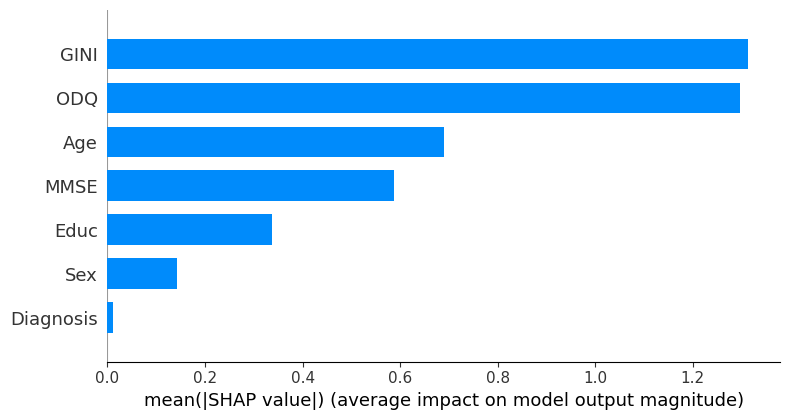

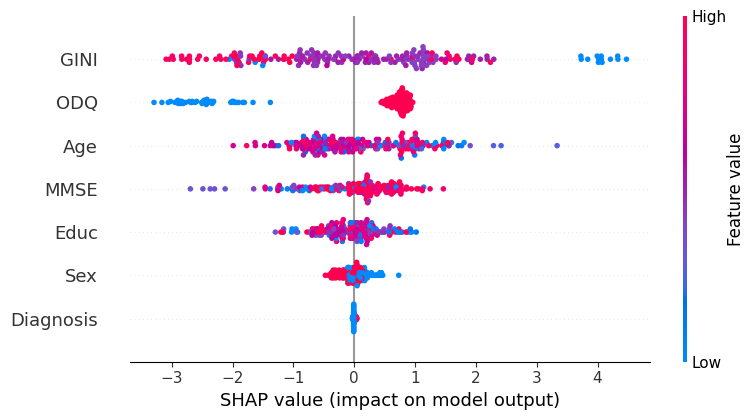

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  1.629973 -0.823259  0.209361  0.108594  0.860350   0.027535  0.683936   
1  0.981595 -0.882442 -0.101281 -0.092557  0.732689   0.032229  0.703788   
2  1.367811  2.032051 -0.253104 -0.070444  0.586878   0.019098  0.679316   
3  0.728558 -0.921897  0.233910 -0.048223  0.319195   0.015223  0.688607   
4 -0.213671  0.208808  0.210983 -0.165288  0.551397   0.022282  0.532233   

   Predictions  Actual Labels  
0     0.938153              1  
1     0.801671              1  
2     0.987683              1  
3     0.738487              1  
4     0.763054              1  


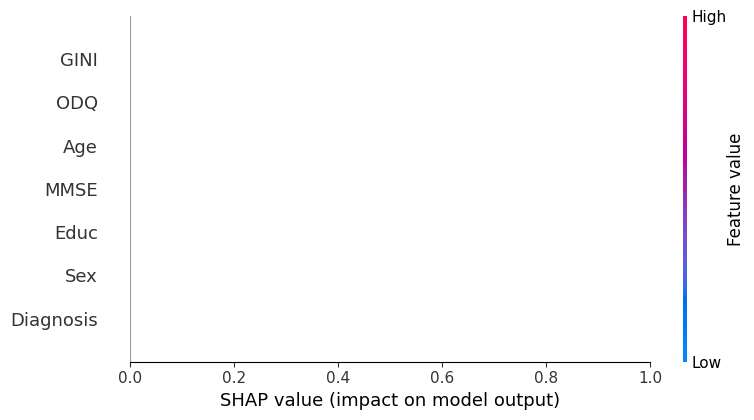

SSV_IFG_L_normalized_b AUC:  0.89 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.811 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)                 None                     None   
Age                       None                 None                     None   
Educ                      None                 None                     None   
Sex                       None                 None                     None   
MMSE                      None                 None                     None   
Diagnosis                 None                 None                     None   
ODQ                       None                 None                     None   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                           None                    None   
Age                            None                    None   
Educ                           None     

100%|██████████| 70/70 [00:05<00:00, 13.43it/s]


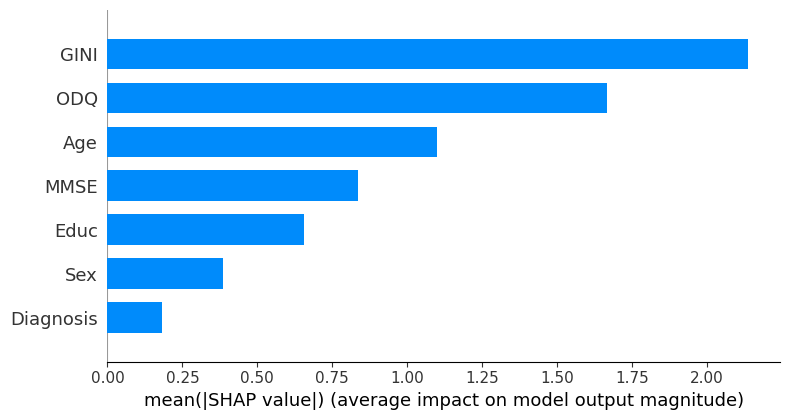

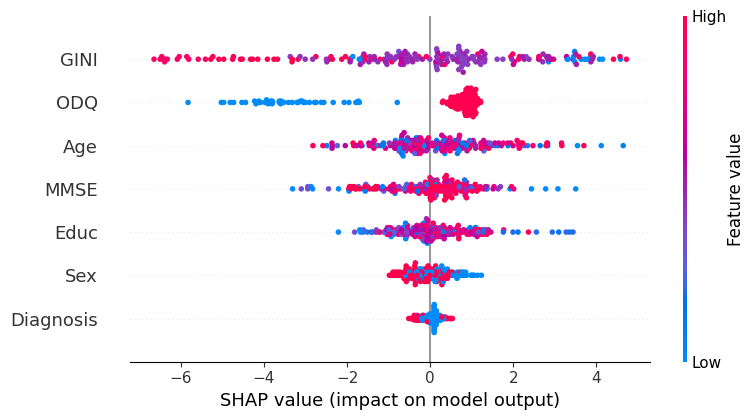

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  3.068385 -0.521765  0.788186 -0.018349  2.491930   0.107668  1.096602   
1  2.153959 -0.547152 -0.418527  0.131033  1.035267  -0.047382  0.915012   
2  2.576295  2.913624  1.060554  0.144370  1.189548  -0.088460  1.177720   
3  1.884284 -0.123099 -0.044099  0.020909  1.114178  -0.146680  0.772647   
4  0.422942  0.641974  1.330782  0.193248  1.326122  -0.098233  0.646291   

   Predictions  Actual Labels  
0     0.999086              1  
1     0.961093              1  
2     0.999871              1  
3     0.969611              1  
4     0.988431              1  


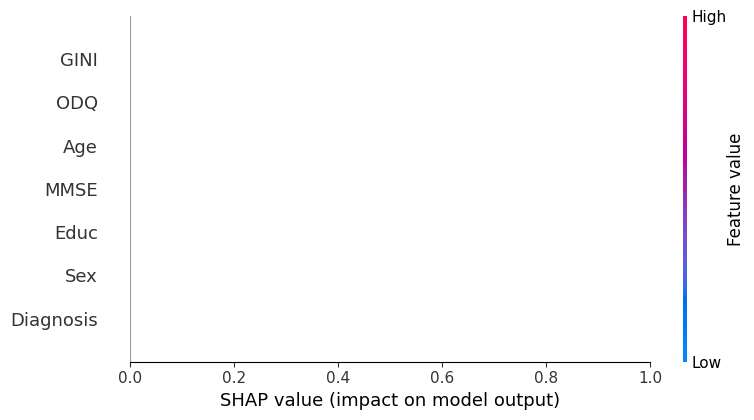

SSV_IFG_R_normalized_b AUC:  0.86 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.798 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)       -0.798 (0.000)                     None   
Age             -0.158 (0.000)                 None                     None   
Educ             0.249 (0.000)                 None                     None   
Sex             -0.086 (0.000)                 None                     None   
MMSE             0.333 (0.000)                 None                     None   
Diagnosis       -0.081 (0.000)                 None                     None   
ODQ              1.245 (0.000)                 None                     None   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                           None                    None   
Age                            None                    None   
Educ                           None     

100%|██████████| 70/70 [00:07<00:00,  9.92it/s]


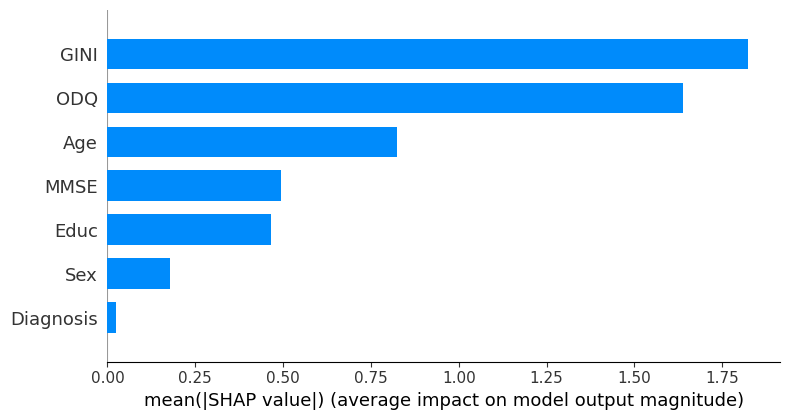

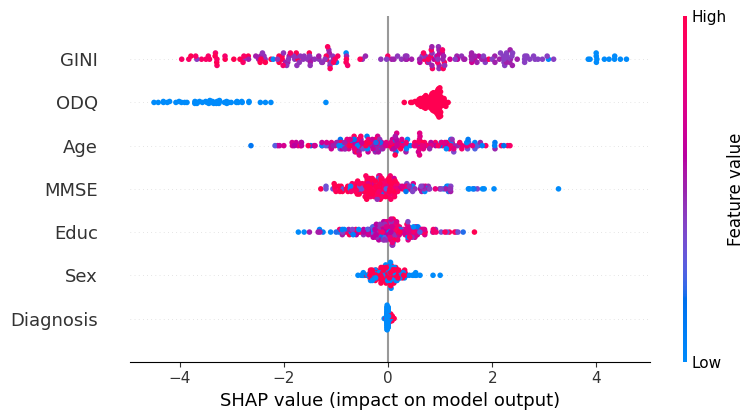

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  2.081481 -1.239895  0.983206 -0.017928  1.526486   0.060908  0.948119   
1  1.188901 -1.028008 -0.167892  0.205112  0.860651   0.087909  0.874820   
2  1.362244  0.851317  0.217345  0.060214  1.629071   0.051375  0.758598   
3  0.813985 -0.933913  0.227535 -0.051543  1.008289   0.108532  0.853802   
4 -1.063213  1.091837  0.562472  0.012625  1.105987   0.059321  0.718127   

   Predictions  Actual Labels  
0     0.986747              1  
1     0.879669              1  
2     0.992594              1  
3     0.880217              1  
4     0.920923              1  


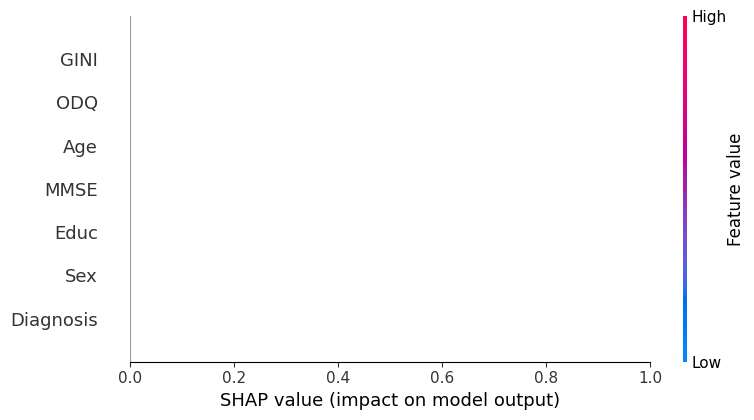

SSV_TEMP_left_normalized_b AUC:  0.9 +-(  0.0 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.817 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)       -0.798 (0.000)           -0.817 (0.000)   
Age             -0.158 (0.000)       -0.071 (0.936)                     None   
Educ             0.249 (0.000)        0.189 (0.000)                     None   
Sex             -0.086 (0.000)       -0.099 (0.000)                     None   
MMSE             0.333 (0.000)        0.236 (0.000)                     None   
Diagnosis       -0.081 (0.000)       -0.039 (0.228)                     None   
ODQ              1.245 (0.000)        1.242 (0.000)                     None   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                           None                    None   
Age                            None                    None   
Educ                           None   

100%|██████████| 70/70 [00:05<00:00, 13.25it/s]


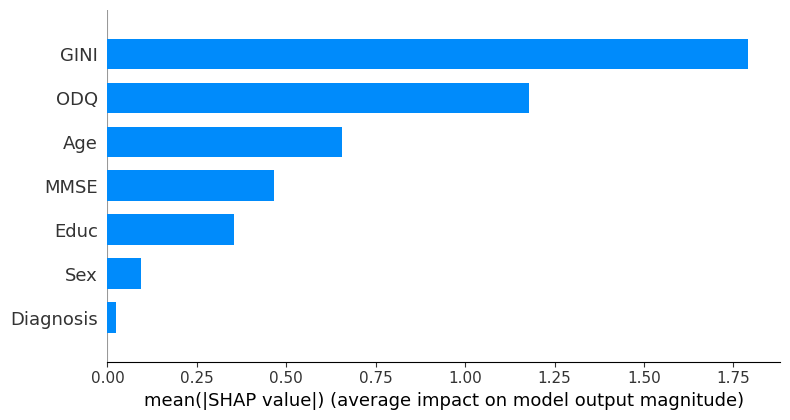

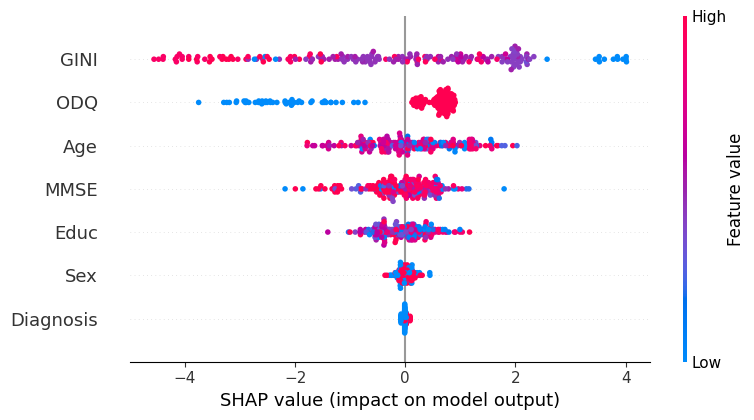

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  2.086296 -0.594198  0.407152 -0.019704  0.794649   0.022135  0.679811   
1  1.260284 -0.790063 -0.100864  0.023997  1.061093   0.024704  0.352742   
2  1.667566  1.613399 -0.040110  0.098686  0.861067   0.011358  0.728646   
3  0.713382 -0.689603  0.085298 -0.120562  0.993337   0.013685  0.293295   
4 -0.687201  0.359128  0.733759  0.053469  0.370629   0.023222  0.299122   

   Predictions  Actual Labels  
0     0.966751              1  
1     0.861245              1  
2     0.992857              1  
3     0.782893              1  
4     0.758762              1  


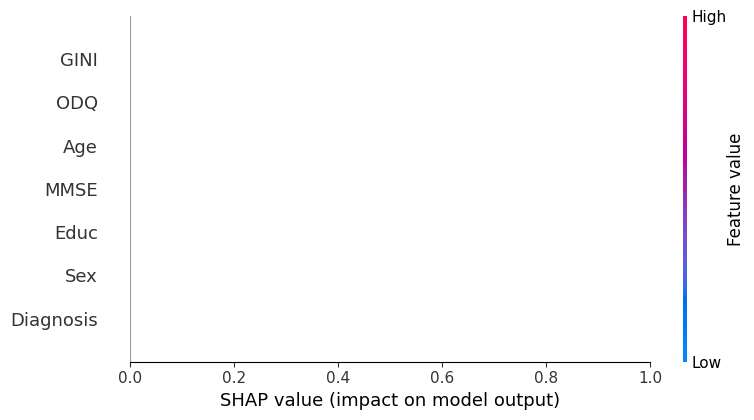

SSV_TEMP_right_normalized_b AUC:  0.89 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.842 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)       -0.798 (0.000)           -0.817 (0.000)   
Age             -0.158 (0.000)       -0.071 (0.936)           -0.154 (0.000)   
Educ             0.249 (0.000)        0.189 (0.000)            0.249 (0.000)   
Sex             -0.086 (0.000)       -0.099 (0.000)           -0.114 (0.000)   
MMSE             0.333 (0.000)        0.236 (0.000)           -0.153 (0.000)   
Diagnosis       -0.081 (0.000)       -0.039 (0.228)            0.105 (0.000)   
ODQ              1.245 (0.000)        1.242 (0.000)            1.301 (0.000)   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                 -0.842 (0.000)                    None   
Age                            None                    None   
Educ                           None

100%|██████████| 70/70 [00:07<00:00,  9.32it/s]


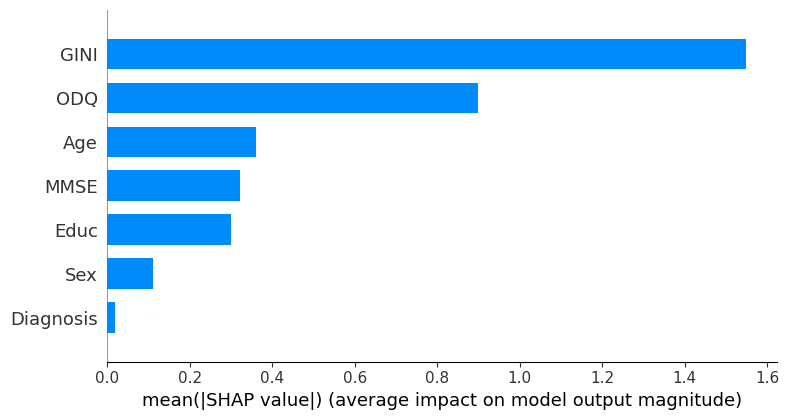

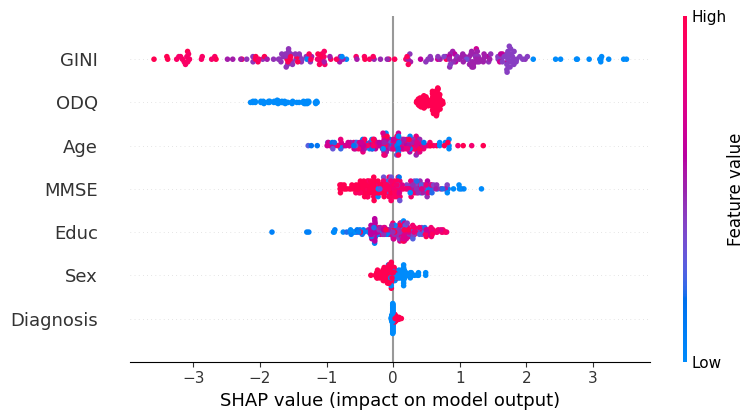

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  1.272758 -0.751562  0.311168 -0.111780  0.683173   0.100378  0.570025   
1  1.285543 -0.833535  0.111493  0.136289  0.500679   0.082208  0.576024   
2  1.549556  0.165446  0.586642 -0.060336  1.034576   0.100378  0.417100   
3  1.518215  0.308696  0.107687  0.156410  0.551511   0.086544  0.473825   
4  0.250830 -0.242591  0.315904  0.258717  0.783246   0.100961  0.462060   

   Predictions  Actual Labels  
0     0.887808              1  
1     0.864489              1  
2     0.977855              1  
3     0.960732              1  
4     0.872529              1  


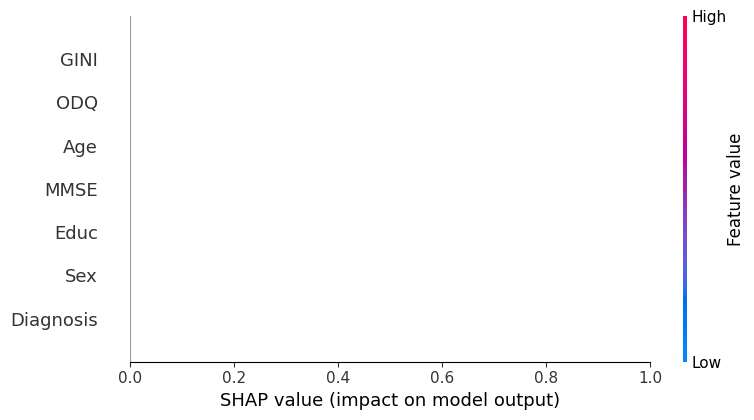

SSV_OCC_left_normalized_b AUC:  0.87 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.811 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)       -0.798 (0.000)           -0.817 (0.000)   
Age             -0.158 (0.000)       -0.071 (0.936)           -0.154 (0.000)   
Educ             0.249 (0.000)        0.189 (0.000)            0.249 (0.000)   
Sex             -0.086 (0.000)       -0.099 (0.000)           -0.114 (0.000)   
MMSE             0.333 (0.000)        0.236 (0.000)           -0.153 (0.000)   
Diagnosis       -0.081 (0.000)       -0.039 (0.228)            0.105 (0.000)   
ODQ              1.245 (0.000)        1.242 (0.000)            1.301 (0.000)   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                 -0.842 (0.000)          -0.811 (0.000)   
Age                  -0.109 (0.001)                    None   
Educ                  0.197 (0.000)  

100%|██████████| 70/70 [00:11<00:00,  6.16it/s]


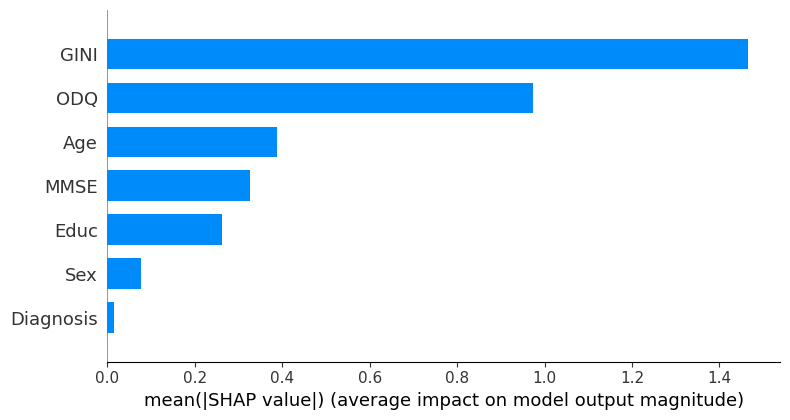

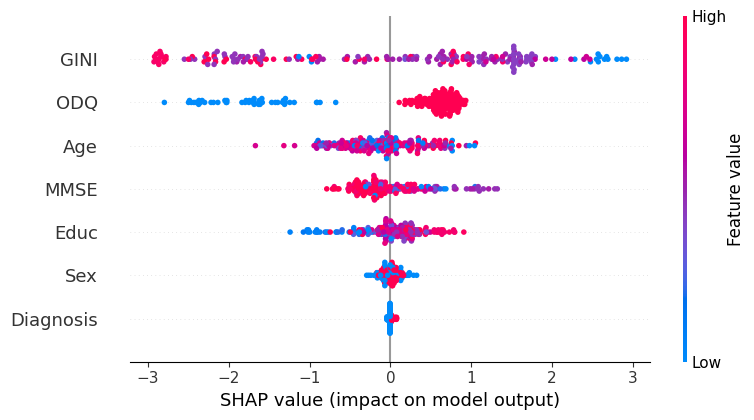

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  1.133489 -0.612108  0.100615 -0.026764  1.187626   0.016315  0.721239   
1  0.432259 -0.693012  0.176745  0.057499  1.229953   0.016315  0.783350   
2  1.085705 -0.032950  0.617558  0.061370  1.182478   0.016315  0.588754   
3  0.406953  0.027576  0.329540  0.165002  1.062614   0.016315  0.463488   
4  0.597365 -0.068939  0.037435  0.084291  1.215777   0.016315  0.609678   

   Predictions  Actual Labels  
0     0.925025              1  
1     0.880309              1  
2     0.971013              1  
3     0.921560              1  
4     0.923025              1  


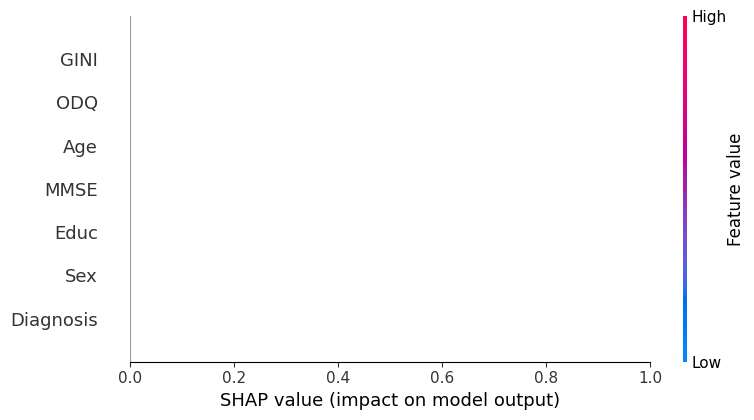

SSV_OCC_right_normalized_b AUC:  0.92 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.751 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)       -0.798 (0.000)           -0.817 (0.000)   
Age             -0.158 (0.000)       -0.071 (0.936)           -0.154 (0.000)   
Educ             0.249 (0.000)        0.189 (0.000)            0.249 (0.000)   
Sex             -0.086 (0.000)       -0.099 (0.000)           -0.114 (0.000)   
MMSE             0.333 (0.000)        0.236 (0.000)           -0.153 (0.000)   
Diagnosis       -0.081 (0.000)       -0.039 (0.228)            0.105 (0.000)   
ODQ              1.245 (0.000)        1.242 (0.000)            1.301 (0.000)   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                 -0.842 (0.000)          -0.811 (0.000)   
Age                  -0.109 (0.001)          -0.055 (1.000)   
Educ                  0.197 (0.000) 

100%|██████████| 70/70 [00:12<00:00,  5.78it/s]


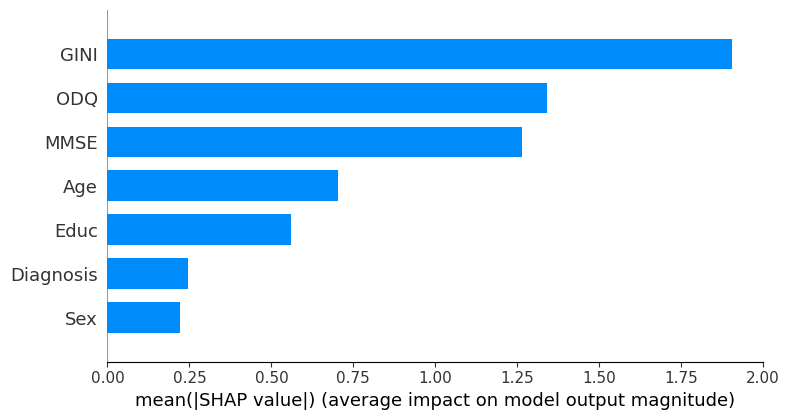

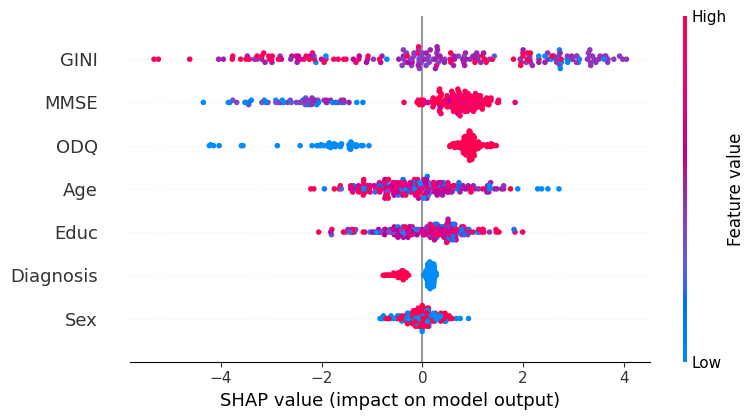

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  2.367913 -1.237465  0.369522 -0.297874  1.239687  -0.652428  0.932545   
1  2.745667 -1.159707 -0.905032  0.150095  1.105053  -0.557383  0.984541   
2  2.395679  0.606917  1.283838  0.012360 -1.548956  -0.455052  0.721533   
3  2.864479 -0.472475  0.656578  0.267653 -1.752216  -0.659704  0.782906   
4  2.728083  0.034034  0.560549  0.363139 -1.561485  -0.777130  0.777214   

   Predictions  Actual Labels  
0     0.946126              1  
1     0.924635              1  
2     0.959307              1  
3     0.861887              1  
4     0.906211              1  


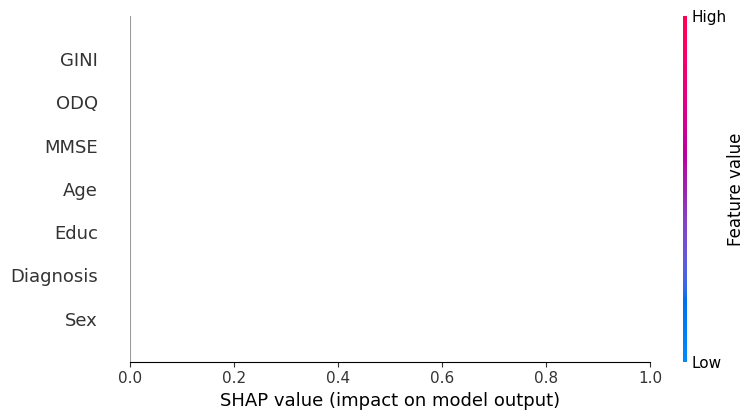

WMEAN_ALL_normalized_b AUC:  0.88 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.676 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)       -0.798 (0.000)           -0.817 (0.000)   
Age             -0.158 (0.000)       -0.071 (0.936)           -0.154 (0.000)   
Educ             0.249 (0.000)        0.189 (0.000)            0.249 (0.000)   
Sex             -0.086 (0.000)       -0.099 (0.000)           -0.114 (0.000)   
MMSE             0.333 (0.000)        0.236 (0.000)           -0.153 (0.000)   
Diagnosis       -0.081 (0.000)       -0.039 (0.228)            0.105 (0.000)   
ODQ              1.245 (0.000)        1.242 (0.000)            1.301 (0.000)   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                 -0.842 (0.000)          -0.811 (0.000)   
Age                  -0.109 (0.001)          -0.055 (1.000)   
Educ                  0.197 (0.000)     

100%|██████████| 70/70 [00:26<00:00,  2.64it/s]


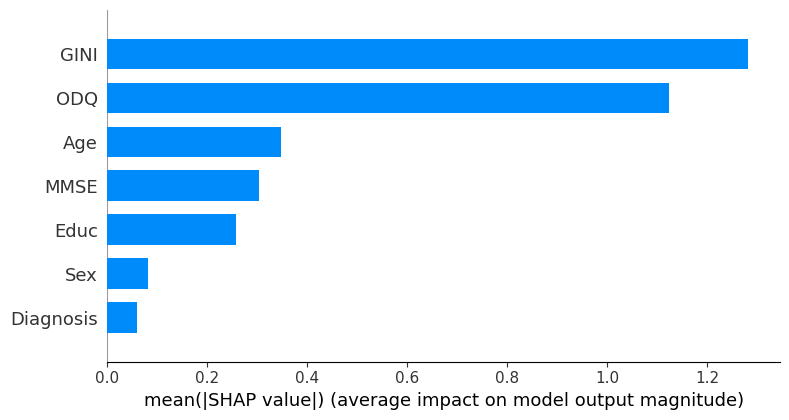

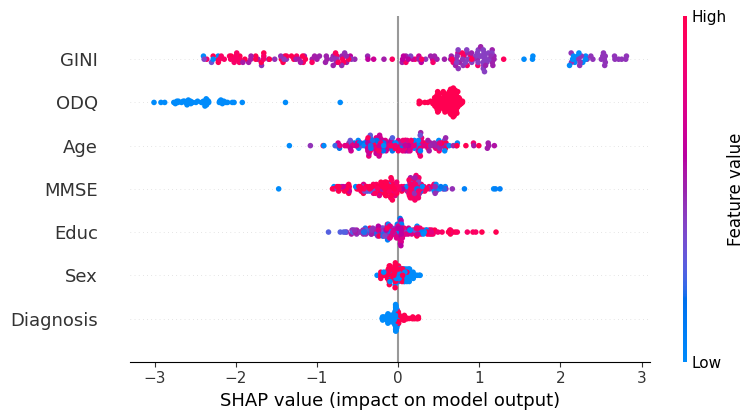

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  1.609723 -0.181161  0.223804 -0.069894  0.367324   0.054440  0.721417   
1  1.412028 -0.136812 -0.141011  0.123252  0.133635  -0.004592  0.414317   
2  1.525820 -0.192814  0.502918 -0.050054  0.443589   0.030568  0.700218   
3  1.097533  0.395538 -0.166112  0.029090  0.362555   0.024075  0.438836   
4  0.796080  0.154364  0.169019  0.078317  0.249171   0.015878  0.429293   

   Predictions  Actual Labels  
0     0.938614              1  
1     0.858439              1  
2     0.950819              1  
3     0.898720              1  
4     0.869175              1  


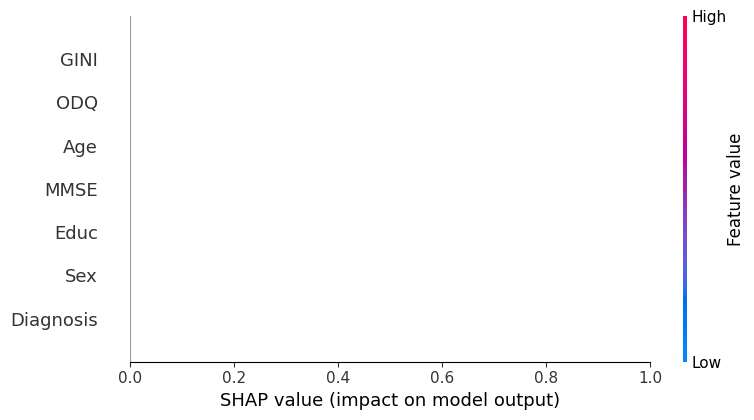

PE_ALL_normalized_b AUC:  0.91 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.794 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)       -0.798 (0.000)           -0.817 (0.000)   
Age             -0.158 (0.000)       -0.071 (0.936)           -0.154 (0.000)   
Educ             0.249 (0.000)        0.189 (0.000)            0.249 (0.000)   
Sex             -0.086 (0.000)       -0.099 (0.000)           -0.114 (0.000)   
MMSE             0.333 (0.000)        0.236 (0.000)           -0.153 (0.000)   
Diagnosis       -0.081 (0.000)       -0.039 (0.228)            0.105 (0.000)   
ODQ              1.245 (0.000)        1.242 (0.000)            1.301 (0.000)   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                 -0.842 (0.000)          -0.811 (0.000)   
Age                  -0.109 (0.001)          -0.055 (1.000)   
Educ                  0.197 (0.000)        

100%|██████████| 70/70 [00:11<00:00,  6.27it/s]


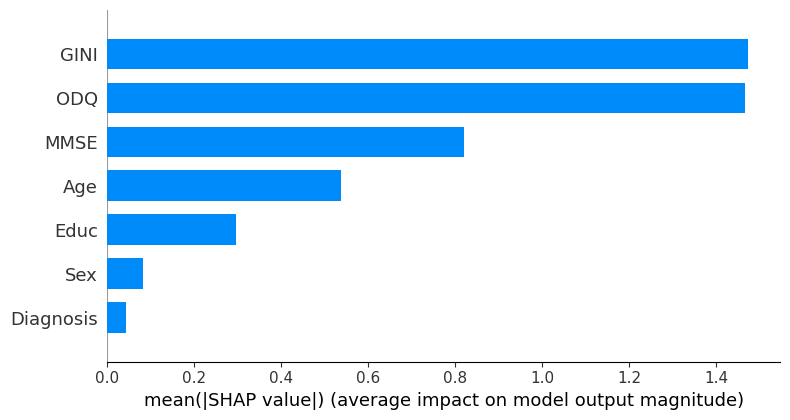

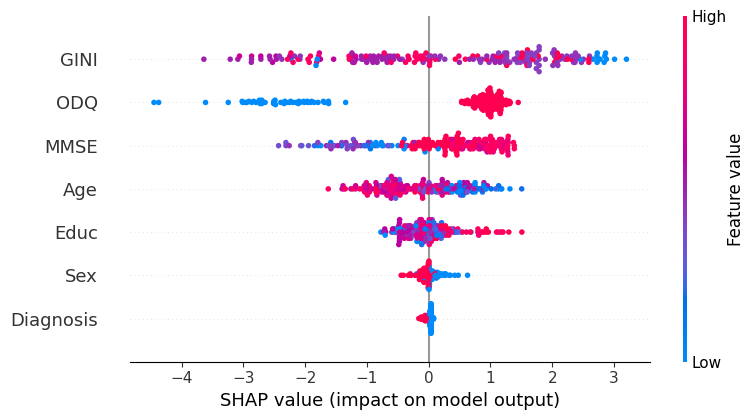

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  0.294263 -0.752778 -0.046102 -0.082328 -0.498378  -0.119796  0.816951   
1  0.271019 -0.631777 -0.116743  0.104628 -0.470014  -0.107306  0.844844   
2  0.457963  0.726907  0.715607 -0.112257 -1.750611  -0.119796  0.429602   
3  0.587790 -0.443425  0.160817  0.147029 -1.079698  -0.107306  0.750972   
4  1.312166 -0.096971  0.144936  0.160783 -1.470441  -0.119796  0.674203   

   Predictions  Actual Labels  
0     0.400888              0  
1     0.470298              1  
2     0.582688              1  
3     0.500645              1  
4     0.643659              1  


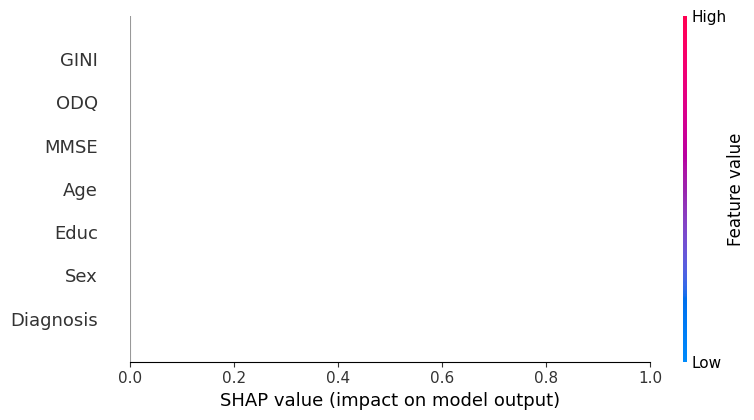

FD_ALL_normalized_b AUC:  0.9 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.616 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)       -0.798 (0.000)           -0.817 (0.000)   
Age             -0.158 (0.000)       -0.071 (0.936)           -0.154 (0.000)   
Educ             0.249 (0.000)        0.189 (0.000)            0.249 (0.000)   
Sex             -0.086 (0.000)       -0.099 (0.000)           -0.114 (0.000)   
MMSE             0.333 (0.000)        0.236 (0.000)           -0.153 (0.000)   
Diagnosis       -0.081 (0.000)       -0.039 (0.228)            0.105 (0.000)   
ODQ              1.245 (0.000)        1.242 (0.000)            1.301 (0.000)   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                 -0.842 (0.000)          -0.811 (0.000)   
Age                  -0.109 (0.001)          -0.055 (1.000)   
Educ                  0.197 (0.000)         

In [ ]:
import pandas as pd

gini_age_results_preliminar = {}
gini_age_results_auc_preliminar = {}
gini_age_paragram = {}
outcome_directions = {}

all_predictors = ['GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'Diagnosis', 'ODQ']

df_metrics_slopes = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_correlation = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_pval = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_dir = pd.DataFrame(index=all_predictors, columns=outcomes_list)

df_metrics_averagersquared = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_t_values = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_f_values = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_f_p_values = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_cohen_f2_values = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_r_values = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_slopes_todo = pd.DataFrame(index=all_predictors, columns=outcomes_list)


for predictor in all_predictors:
    df_metrics_slopes.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_pval.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_dir.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_correlation.loc[predictor] = [None] * len(outcomes_list)


    df_metrics_averagersquared.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_average_t_values.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_average_f_values.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_average_f_p_values.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_average_cohen_f2_values.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_average_r_values.loc[predictor] = [None] * len(outcomes_list)
    df_metrics_slopes_todo.loc[predictor] = [None] * len(outcomes_list)


for outcome in outcomes_list:
    print(f"Processing outcome: {outcome}")

    compl_df_mmse = compl_df_mod[[outcome, 'GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'Diagnosis', 'ODQ']]



    compl_df_mmse = compl_df_mmse.dropna()
    compl_df_mmse.reset_index(drop=True, inplace=True)



    median = compl_df_mmse[outcome].median()


    compl_df_mmse[outcome + '_b'] = (compl_df_mmse[outcome] > median).astype(int)


    y_compl_1A = compl_df_mmse[outcome + '_b']
    X_compl_1A = compl_df_mmse[['GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'Diagnosis', 'ODQ']]
    diagnosis = compl_df_mmse['Diagnosis']


    opt_XGB = SearchBestModel(X_compl_1A, y_compl_1A)
    params_ = dict(opt_XGB.best_params_)

    try:

        result_data = classifier_ROC(X_compl_1A, y_compl_1A, diagnosis, False, params_)



        gini_age_results_preliminar[outcome] = result_data['results_']
        gini_age_results_auc_preliminar[outcome] = result_data['results_'][2]
        gini_age_paragram[outcome] = params_





        combined_p = result_data['combined_p']
        slopes = result_data['slopes']
        directions = result_data['directions']
        intercepts = result_data['intercepts']
        correlation = result_data['correlations']


        averagersquared=result_data['rsquared']
        average_t_values=result_data['average_t_values']
        average_f_values=result_data['fvalues']
        average_f_p_values=result_data['fpvalues']
        average_cohen_f2_values=result_data['cohenf2values']
        average_r_values=result_data['average_r_values']

        slopes_todo = result_data['slopes_todo']


        for feature in X_compl_1A.columns:

            if feature in combined_p:
                average_slope = np.mean(slopes[feature])


                df_metrics_slopes.loc[feature, outcome] = f"{average_slope:.3f} ({combined_p[feature]:.3f})"



                df_metrics_pval.loc[feature, outcome] = combined_p[feature]


                df_metrics_dir.loc[feature, outcome] = directions[feature]

                df_metrics_correlation.loc[feature, outcome] = correlation[feature]

                df_metrics_slopes_todo.loc[feature, outcome] = slopes_todo[feature]


                df_metrics_averagersquared.loc[feature, outcome] = averagersquared[feature]
                df_metrics_average_t_values.loc[feature, outcome] = average_t_values[feature]
                df_metrics_average_f_values.loc[feature, outcome] = average_f_values[feature]
                df_metrics_average_f_p_values.loc[feature, outcome] = average_f_p_values[feature]
                df_metrics_average_cohen_f2_values.loc[feature, outcome] = average_cohen_f2_values[feature]
                df_metrics_average_r_values.loc[feature, outcome] = average_r_values[feature]


    except Exception as e:
        print(f'Error con {outcome + "_b"}: {e}')

features = []
estimates = []
t_values_list = []
p_values_list = []
r_squared_values = []
f2_values = []
f_values_list = []
f_p_values_list = []


with pd.ExcelWriter(f'{base_path}resultados_completos_____.xlsx') as writer:
    df_metrics_slopes.to_excel(writer, sheet_name='Slopes')
    df_metrics_pval.to_excel(writer, sheet_name='P-Values')
    df_metrics_dir.to_excel(writer, sheet_name='Directions')
    df_metrics_correlation.to_excel(writer, sheet_name='Correlation')
    df_metrics_averagersquared.to_excel(writer, sheet_name='R-Squared')
    df_metrics_average_t_values.to_excel(writer, sheet_name='T-Values')
    df_metrics_average_f_values.to_excel(writer, sheet_name='F-Values')
    df_metrics_average_f_p_values.to_excel(writer, sheet_name='F-P-Values')
    df_metrics_average_cohen_f2_values.to_excel(writer, sheet_name='Cohen-F2')
    df_metrics_average_r_values.to_excel(writer, sheet_name='R-values')
    df_metrics_slopes_todo.to_excel(writer, sheet_name='slopes_todo')




print(df_metrics_slopes)


print(df_metrics_pval)


print(df_metrics_dir)


print(df_metrics_correlation)

In [ ]:
top_10_keys_GINI_AGE_preliminar =heapq.nlargest(10, gini_age_results_auc_preliminar, key=gini_age_results_auc_preliminar.get)
top_10_keys_GINI_AGE_preliminar

['SSV_OCC_right_normalized',
 'PE_ALL_normalized',
 'SSV_TEMP_left_normalized',
 'FD_ALL_normalized',
 'SSV_IFG_L_normalized',
 'SSV_TEMP_right_normalized',
 'WMEAN_ALL_normalized',
 'SSV_OCC_left_normalized',
 'SSV_IFG_R_normalized']

Processing outcome: SSV_OCC_right_normalized
XGB
val. score: 0.8414285714285713
test score: 0.845771144278607
best parameters: OrderedDict({'colsample_bytree': 0.9, 'eval_metric': 'logloss', 'learning_rate': 0.1, 'max_depth': 4, 'objective': 'binary:logistic', 'reg_alpha': 1.0, 'reg_lambda': 0, 'subsample': 1.0})
---------------------------------------------

Media de X_train escalado: GINI         0.568322
Age          0.537135
Educ         0.482714
Sex          0.579213
MMSE         0.815050
Diagnosis    0.289638
ODQ          0.824532
dtype: float64
Desviación estándar de X_train escalado: GINI         0.248515
Age          0.198800
Educ         0.157025
Sex          0.442973
MMSE         0.166986
Diagnosis    0.453594
ODQ          0.201927
dtype: float64
Media de X_train test: GINI         0.562190
Age          0.530448
Educ         0.479937
Sex          0.587313
MMSE         0.815672
Diagnosis    0.288557
ODQ          0.863433
dtype: float64
Desviación estándar de X_test: GINI     

100%|██████████| 70/70 [00:08<00:00,  8.61it/s]


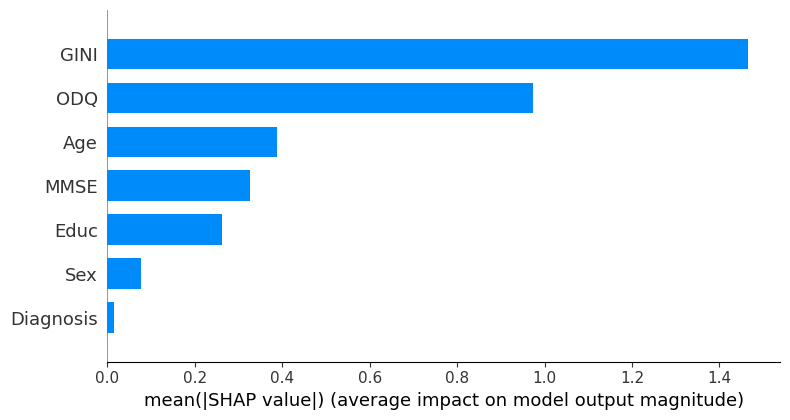

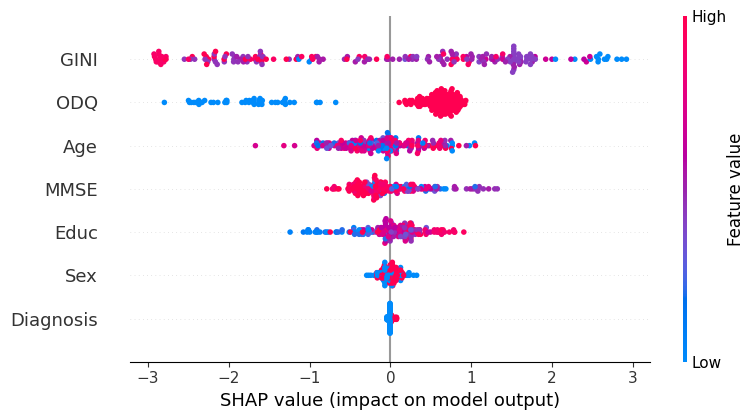

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  1.133489 -0.612108  0.100615 -0.026764  1.187626   0.016315  0.721239   
1  0.432259 -0.693012  0.176745  0.057499  1.229953   0.016315  0.783350   
2  1.085705 -0.032950  0.617558  0.061370  1.182478   0.016315  0.588754   
3  0.406953  0.027576  0.329540  0.165002  1.062614   0.016315  0.463488   
4  0.597365 -0.068939  0.037435  0.084291  1.215777   0.016315  0.609678   

   Predictions  Actual Labels  
0     0.925025              1  
1     0.880309              1  
2     0.971013              1  
3     0.921560              1  
4     0.923025              1  


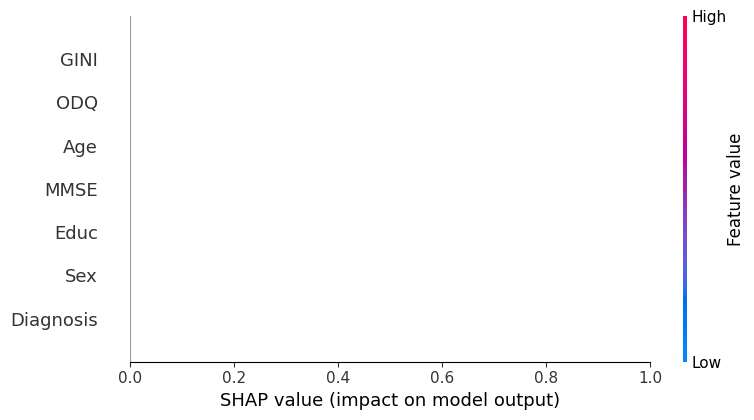

SSV_OCC_right_normalized_b AUC:  0.92 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.751 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI                       NaN                  NaN                      NaN   
Age                        NaN                  NaN                      NaN   
Educ                       NaN                  NaN                      NaN   
Sex                        NaN                  NaN                      NaN   
MMSE                       NaN                  NaN                      NaN   
Diagnosis                  NaN                  NaN                      NaN   
ODQ                        NaN                  NaN                      NaN   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                            NaN                     NaN   
Age                             NaN                     NaN   
Educ                            NaN 

100%|██████████| 70/70 [00:23<00:00,  3.04it/s]


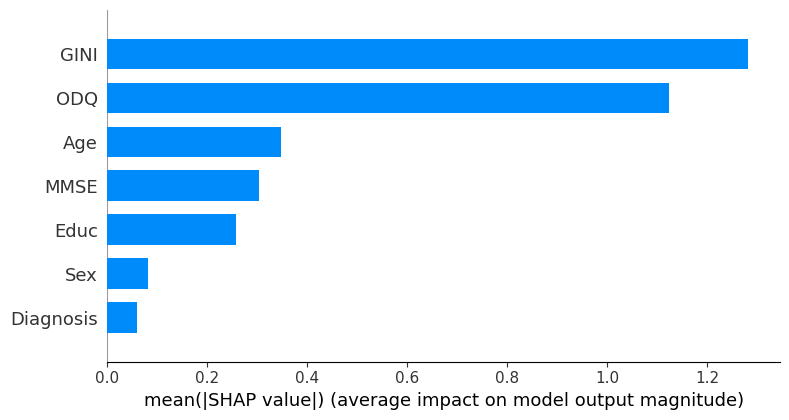

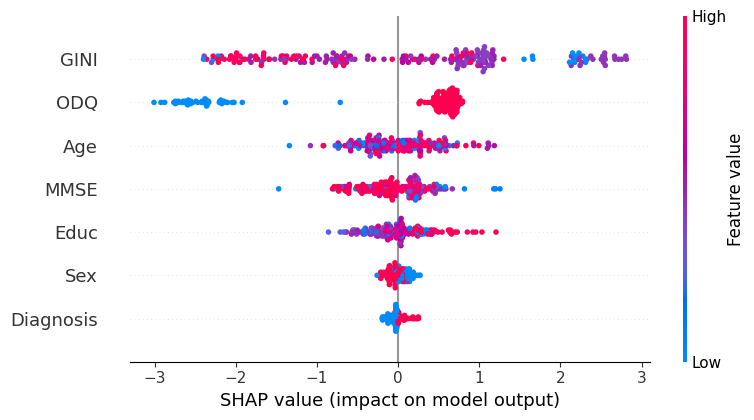

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  1.609723 -0.181161  0.223804 -0.069894  0.367324   0.054440  0.721417   
1  1.412028 -0.136812 -0.141011  0.123252  0.133635  -0.004592  0.414317   
2  1.525820 -0.192814  0.502918 -0.050054  0.443589   0.030568  0.700218   
3  1.097533  0.395538 -0.166112  0.029090  0.362555   0.024075  0.438836   
4  0.796080  0.154364  0.169019  0.078317  0.249171   0.015878  0.429293   

   Predictions  Actual Labels  
0     0.938614              1  
1     0.858439              1  
2     0.950819              1  
3     0.898720              1  
4     0.869175              1  


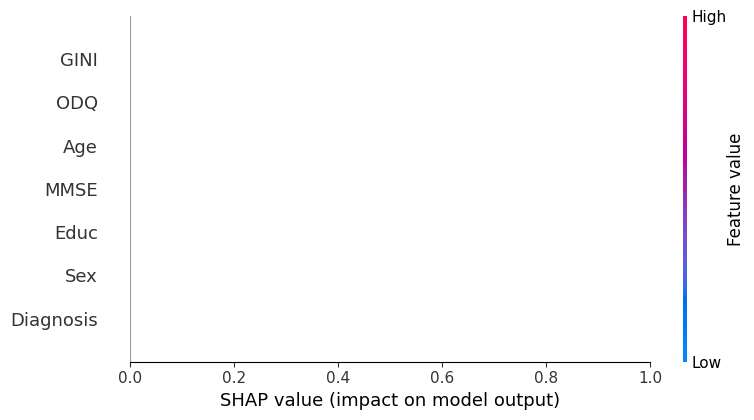

PE_ALL_normalized_b AUC:  0.91 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.794 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI                       NaN                  NaN                      NaN   
Age                        NaN                  NaN                      NaN   
Educ                       NaN                  NaN                      NaN   
Sex                        NaN                  NaN                      NaN   
MMSE                       NaN                  NaN                      NaN   
Diagnosis                  NaN                  NaN                      NaN   
ODQ                        NaN                  NaN                      NaN   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                            NaN                     NaN   
Age                             NaN                     NaN   
Educ                            NaN        

100%|██████████| 70/70 [00:06<00:00, 10.34it/s]


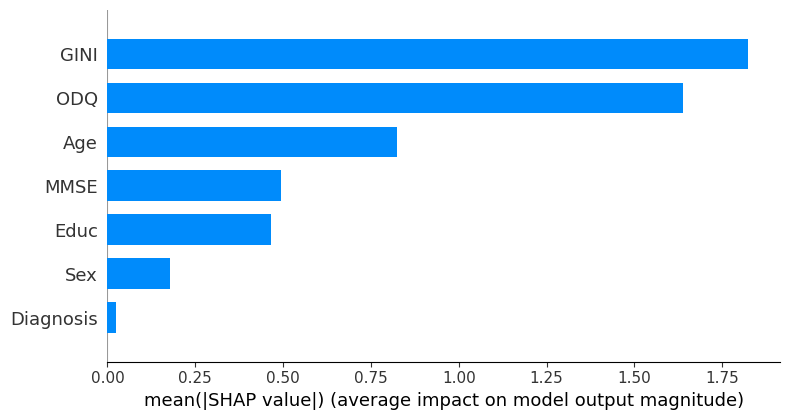

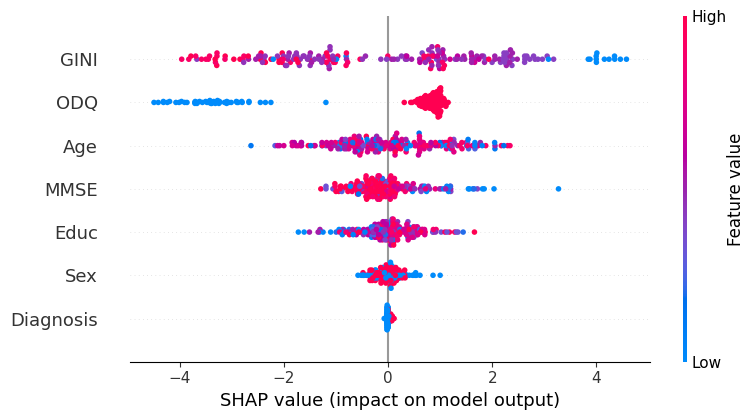

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  2.081481 -1.239895  0.983206 -0.017928  1.526486   0.060908  0.948119   
1  1.188901 -1.028008 -0.167892  0.205112  0.860651   0.087909  0.874820   
2  1.362244  0.851317  0.217345  0.060214  1.629071   0.051375  0.758598   
3  0.813985 -0.933913  0.227535 -0.051543  1.008289   0.108532  0.853802   
4 -1.063213  1.091837  0.562472  0.012625  1.105987   0.059321  0.718127   

   Predictions  Actual Labels  
0     0.986747              1  
1     0.879669              1  
2     0.992594              1  
3     0.880217              1  
4     0.920923              1  


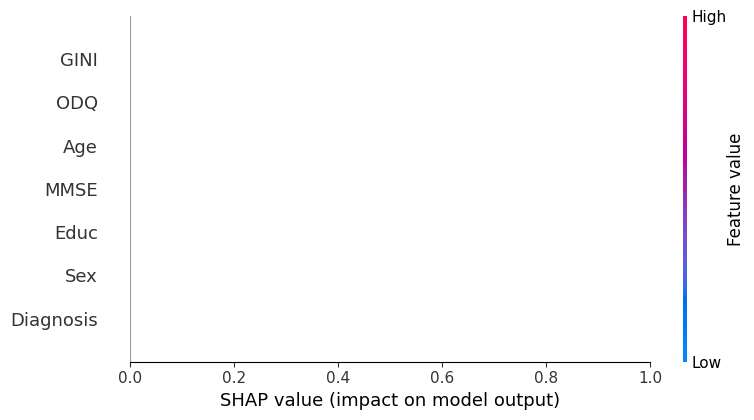

SSV_TEMP_left_normalized_b AUC:  0.9 +-(  0.0 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.817 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI                       NaN                  NaN           -0.817 (0.000)   
Age                        NaN                  NaN                      NaN   
Educ                       NaN                  NaN                      NaN   
Sex                        NaN                  NaN                      NaN   
MMSE                       NaN                  NaN                      NaN   
Diagnosis                  NaN                  NaN                      NaN   
ODQ                        NaN                  NaN                      NaN   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                            NaN                     NaN   
Age                             NaN                     NaN   
Educ                            NaN   

100%|██████████| 70/70 [00:07<00:00,  8.82it/s]


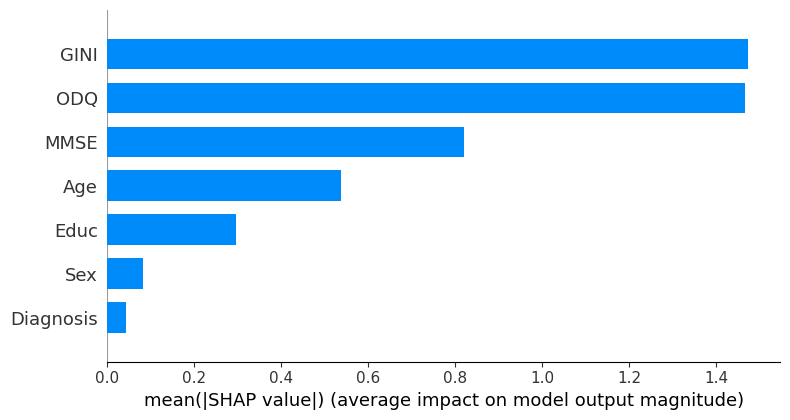

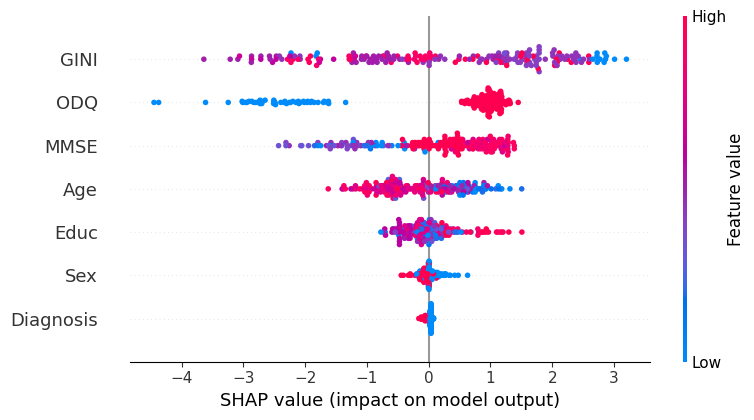

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  0.294263 -0.752778 -0.046102 -0.082328 -0.498378  -0.119796  0.816951   
1  0.271019 -0.631777 -0.116743  0.104628 -0.470014  -0.107306  0.844844   
2  0.457963  0.726907  0.715607 -0.112257 -1.750611  -0.119796  0.429602   
3  0.587790 -0.443425  0.160817  0.147029 -1.079698  -0.107306  0.750972   
4  1.312166 -0.096971  0.144936  0.160783 -1.470441  -0.119796  0.674203   

   Predictions  Actual Labels  
0     0.400888              0  
1     0.470298              1  
2     0.582688              1  
3     0.500645              1  
4     0.643659              1  


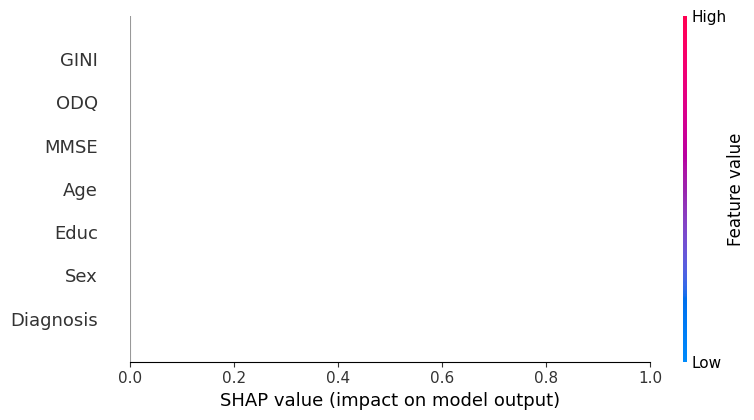

FD_ALL_normalized_b AUC:  0.9 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.616 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI                       NaN                  NaN           -0.817 (0.000)   
Age                        NaN                  NaN           -0.154 (0.000)   
Educ                       NaN                  NaN            0.249 (0.000)   
Sex                        NaN                  NaN           -0.114 (0.000)   
MMSE                       NaN                  NaN           -0.153 (0.000)   
Diagnosis                  NaN                  NaN            0.105 (0.000)   
ODQ                        NaN                  NaN            1.301 (0.000)   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                            NaN                     NaN   
Age                             NaN                     NaN   
Educ                            NaN         

100%|██████████| 70/70 [00:10<00:00,  6.62it/s]


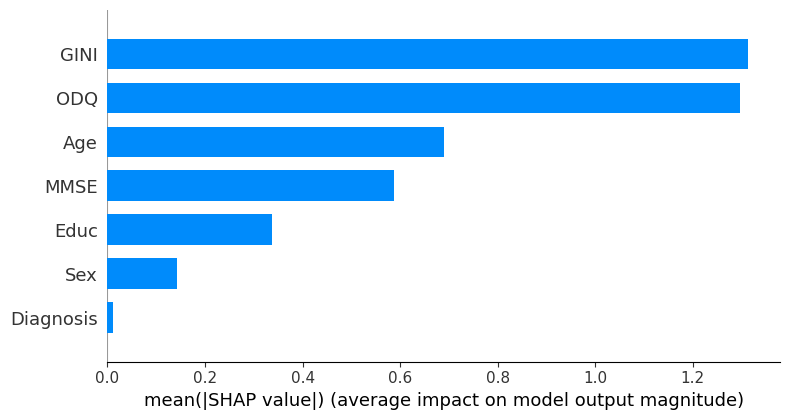

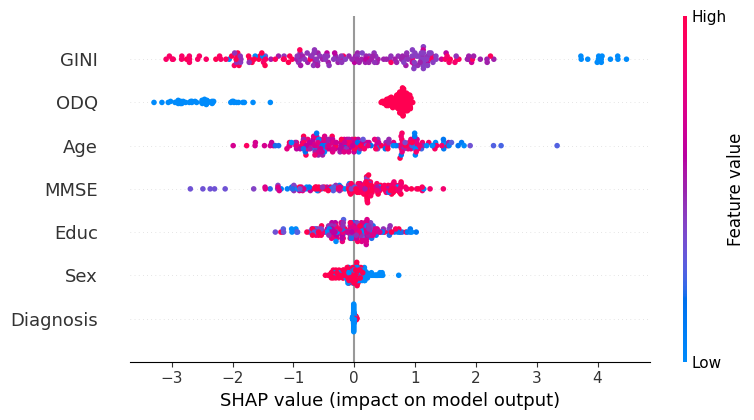

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  1.629973 -0.823259  0.209361  0.108594  0.860350   0.027535  0.683936   
1  0.981595 -0.882442 -0.101281 -0.092557  0.732689   0.032229  0.703788   
2  1.367811  2.032051 -0.253104 -0.070444  0.586878   0.019098  0.679316   
3  0.728558 -0.921897  0.233910 -0.048223  0.319195   0.015223  0.688607   
4 -0.213671  0.208808  0.210983 -0.165288  0.551397   0.022282  0.532233   

   Predictions  Actual Labels  
0     0.938153              1  
1     0.801671              1  
2     0.987683              1  
3     0.738487              1  
4     0.763054              1  


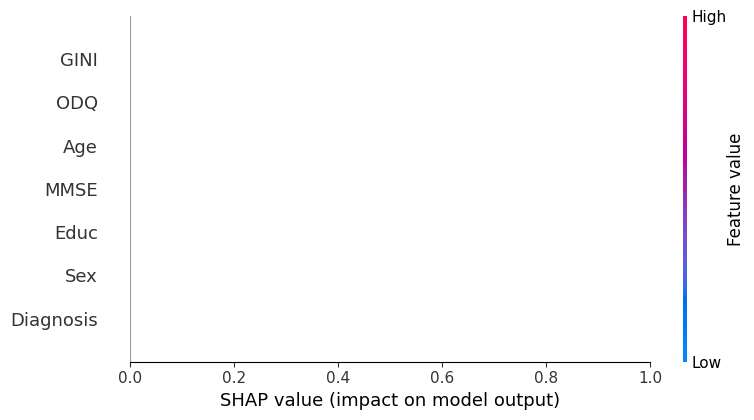

SSV_IFG_L_normalized_b AUC:  0.89 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.811 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)                  NaN           -0.817 (0.000)   
Age                        NaN                  NaN           -0.154 (0.000)   
Educ                       NaN                  NaN            0.249 (0.000)   
Sex                        NaN                  NaN           -0.114 (0.000)   
MMSE                       NaN                  NaN           -0.153 (0.000)   
Diagnosis                  NaN                  NaN            0.105 (0.000)   
ODQ                        NaN                  NaN            1.301 (0.000)   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                            NaN                     NaN   
Age                             NaN                     NaN   
Educ                            NaN     

100%|██████████| 70/70 [00:06<00:00, 11.64it/s]


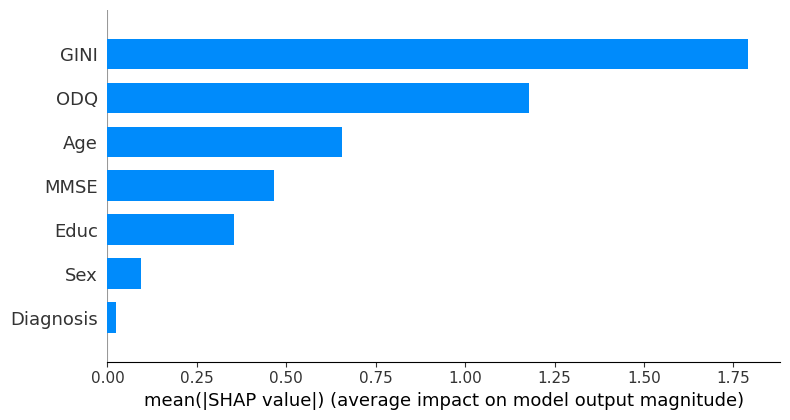

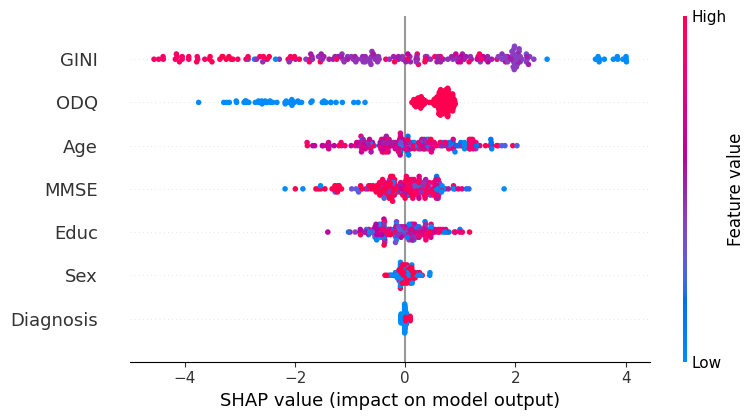

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  2.086296 -0.594198  0.407152 -0.019704  0.794649   0.022135  0.679811   
1  1.260284 -0.790063 -0.100864  0.023997  1.061093   0.024704  0.352742   
2  1.667566  1.613399 -0.040110  0.098686  0.861067   0.011358  0.728646   
3  0.713382 -0.689603  0.085298 -0.120562  0.993337   0.013685  0.293295   
4 -0.687201  0.359128  0.733759  0.053469  0.370629   0.023222  0.299122   

   Predictions  Actual Labels  
0     0.966751              1  
1     0.861245              1  
2     0.992857              1  
3     0.782893              1  
4     0.758762              1  


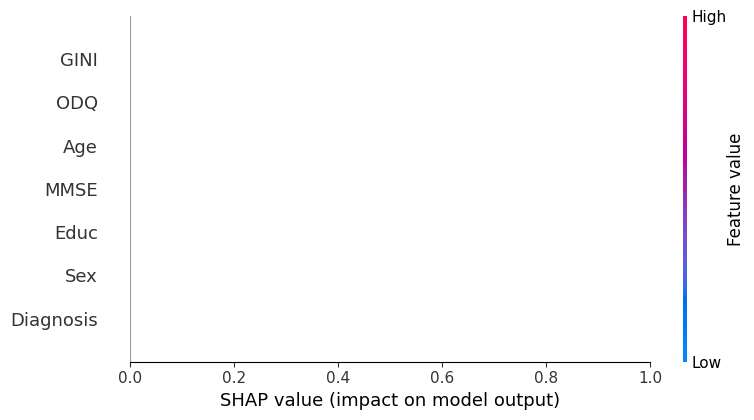

SSV_TEMP_right_normalized_b AUC:  0.89 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.842 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)                  NaN           -0.817 (0.000)   
Age             -0.158 (0.000)                  NaN           -0.154 (0.000)   
Educ             0.249 (0.000)                  NaN            0.249 (0.000)   
Sex             -0.086 (0.000)                  NaN           -0.114 (0.000)   
MMSE             0.333 (0.000)                  NaN           -0.153 (0.000)   
Diagnosis       -0.081 (0.000)                  NaN            0.105 (0.000)   
ODQ              1.245 (0.000)                  NaN            1.301 (0.000)   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                 -0.842 (0.000)                     NaN   
Age                             NaN                     NaN   
Educ                            NaN

100%|██████████| 70/70 [00:11<00:00,  6.10it/s]


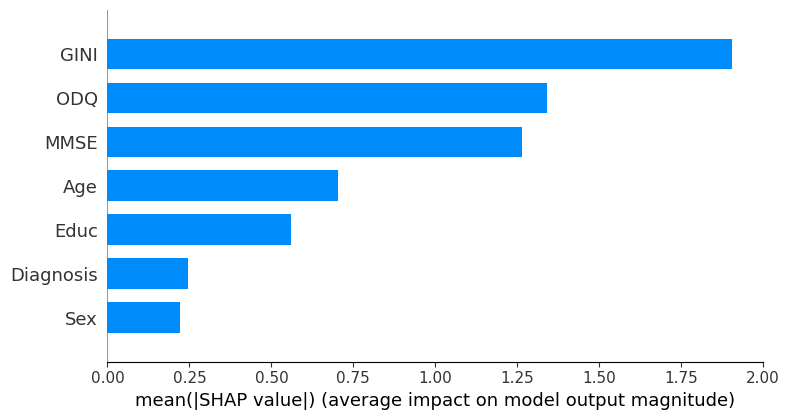

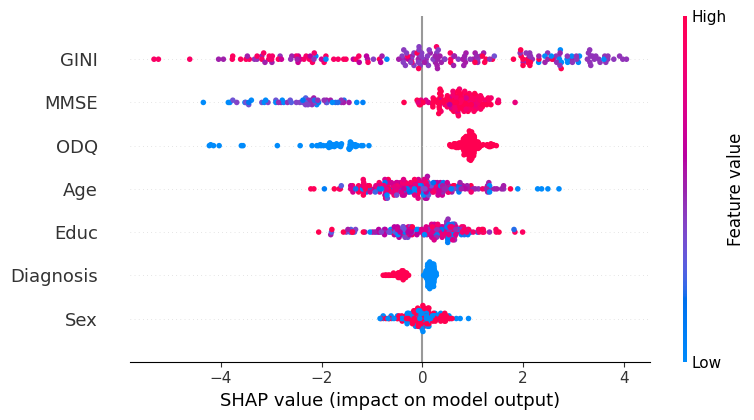

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  2.367913 -1.237465  0.369522 -0.297874  1.239687  -0.652428  0.932545   
1  2.745667 -1.159707 -0.905032  0.150095  1.105053  -0.557383  0.984541   
2  2.395679  0.606917  1.283838  0.012360 -1.548956  -0.455052  0.721533   
3  2.864479 -0.472475  0.656578  0.267653 -1.752216  -0.659704  0.782906   
4  2.728083  0.034034  0.560549  0.363139 -1.561485  -0.777130  0.777214   

   Predictions  Actual Labels  
0     0.946126              1  
1     0.924635              1  
2     0.959307              1  
3     0.861887              1  
4     0.906211              1  


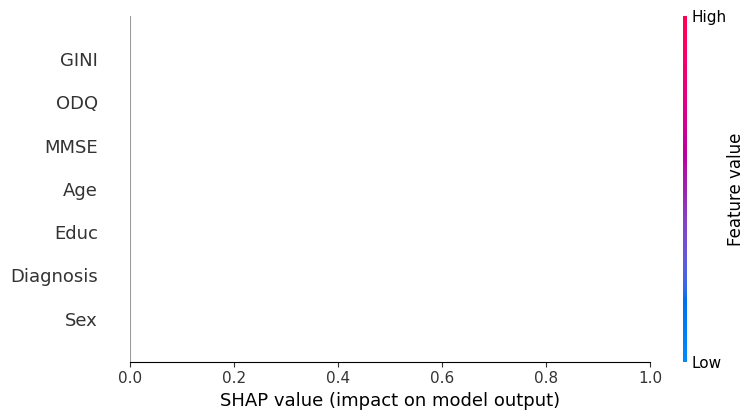

WMEAN_ALL_normalized_b AUC:  0.88 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.676 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)                  NaN           -0.817 (0.000)   
Age             -0.158 (0.000)                  NaN           -0.154 (0.000)   
Educ             0.249 (0.000)                  NaN            0.249 (0.000)   
Sex             -0.086 (0.000)                  NaN           -0.114 (0.000)   
MMSE             0.333 (0.000)                  NaN           -0.153 (0.000)   
Diagnosis       -0.081 (0.000)                  NaN            0.105 (0.000)   
ODQ              1.245 (0.000)                  NaN            1.301 (0.000)   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                 -0.842 (0.000)                     NaN   
Age                  -0.109 (0.001)                     NaN   
Educ                  0.197 (0.000)     

100%|██████████| 70/70 [00:08<00:00,  8.12it/s]


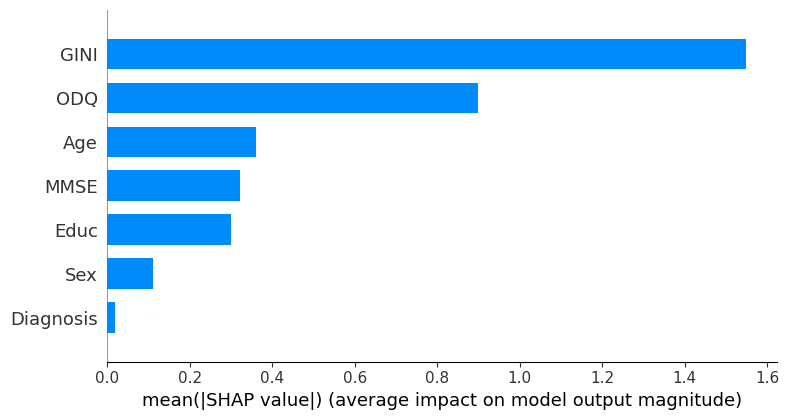

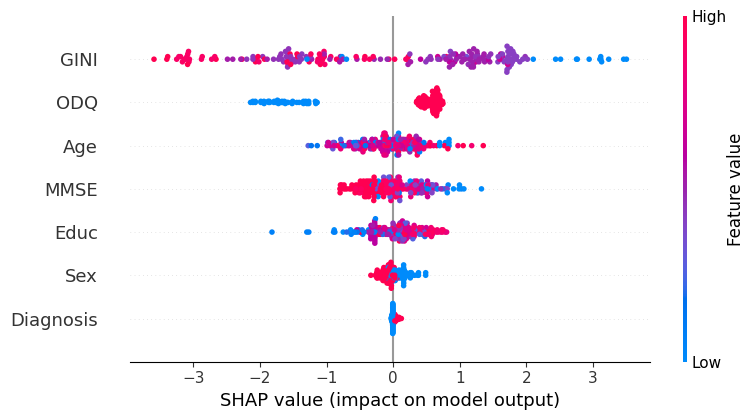

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  1.272758 -0.751562  0.311168 -0.111780  0.683173   0.100378  0.570025   
1  1.285543 -0.833535  0.111493  0.136289  0.500679   0.082208  0.576024   
2  1.549556  0.165446  0.586642 -0.060336  1.034576   0.100378  0.417100   
3  1.518215  0.308696  0.107687  0.156410  0.551511   0.086544  0.473825   
4  0.250830 -0.242591  0.315904  0.258717  0.783246   0.100961  0.462060   

   Predictions  Actual Labels  
0     0.887808              1  
1     0.864489              1  
2     0.977855              1  
3     0.960732              1  
4     0.872529              1  


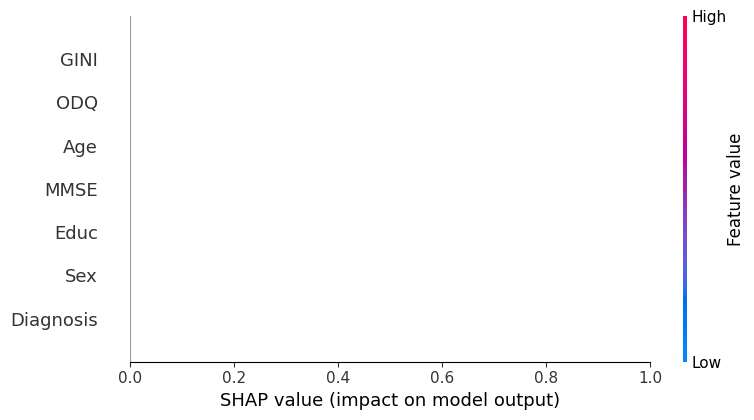

SSV_OCC_left_normalized_b AUC:  0.87 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.811 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)                  NaN           -0.817 (0.000)   
Age             -0.158 (0.000)                  NaN           -0.154 (0.000)   
Educ             0.249 (0.000)                  NaN            0.249 (0.000)   
Sex             -0.086 (0.000)                  NaN           -0.114 (0.000)   
MMSE             0.333 (0.000)                  NaN           -0.153 (0.000)   
Diagnosis       -0.081 (0.000)                  NaN            0.105 (0.000)   
ODQ              1.245 (0.000)                  NaN            1.301 (0.000)   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                 -0.842 (0.000)          -0.811 (0.000)   
Age                  -0.109 (0.001)                     NaN   
Educ                  0.197 (0.000)  

100%|██████████| 70/70 [00:09<00:00,  7.36it/s]


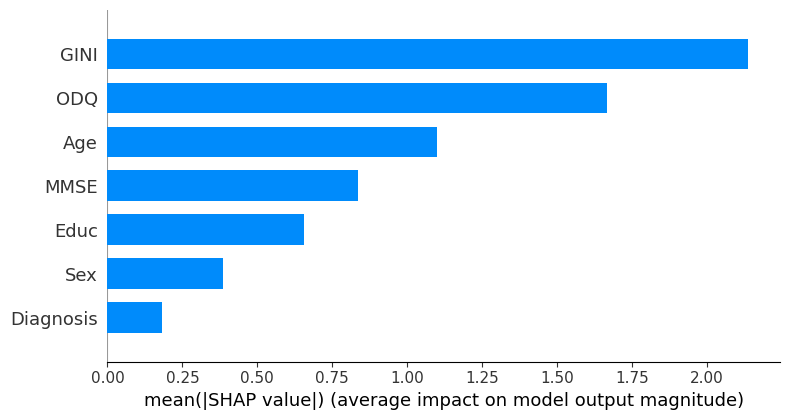

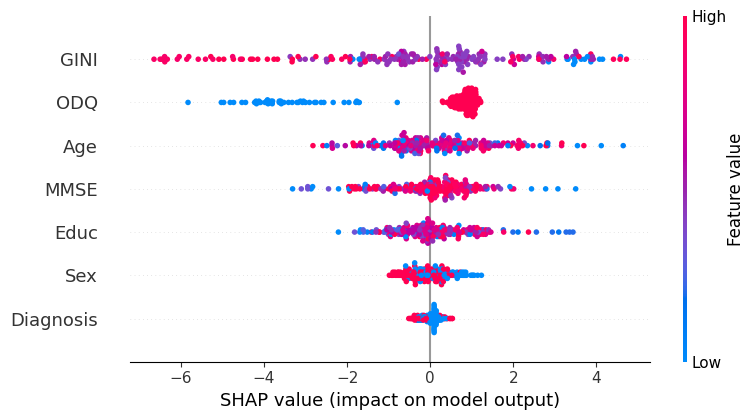

       GINI       Age      Educ       Sex      MMSE  Diagnosis       ODQ  \
0  3.068385 -0.521765  0.788186 -0.018349  2.491930   0.107668  1.096602   
1  2.153959 -0.547152 -0.418527  0.131033  1.035267  -0.047382  0.915012   
2  2.576295  2.913624  1.060554  0.144370  1.189548  -0.088460  1.177720   
3  1.884284 -0.123099 -0.044099  0.020909  1.114178  -0.146680  0.772647   
4  0.422942  0.641974  1.330782  0.193248  1.326122  -0.098233  0.646291   

   Predictions  Actual Labels  
0     0.999086              1  
1     0.961093              1  
2     0.999871              1  
3     0.969611              1  
4     0.988431              1  


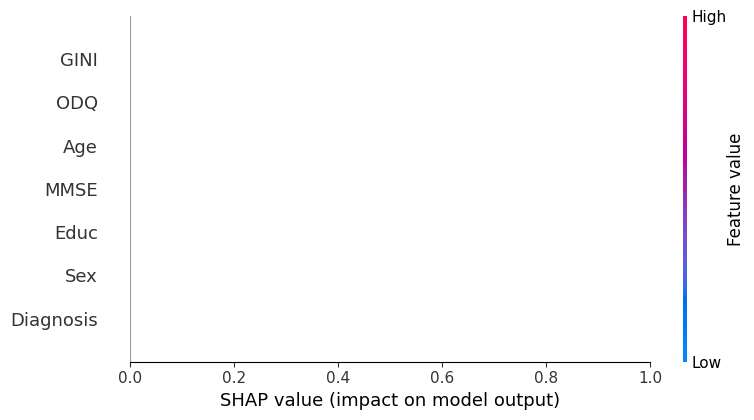

SSV_IFG_R_normalized_b AUC:  0.86 +-(  0.01 ) (1002, 7)
Resultados guardados en 'resultados.xlsx'

salidaaa: -0.798 (0.000)
yupii           SSV_IFG_L_normalized SSV_IFG_R_normalized SSV_TEMP_left_normalized  \
GINI            -0.811 (0.000)       -0.798 (0.000)           -0.817 (0.000)   
Age             -0.158 (0.000)                  NaN           -0.154 (0.000)   
Educ             0.249 (0.000)                  NaN            0.249 (0.000)   
Sex             -0.086 (0.000)                  NaN           -0.114 (0.000)   
MMSE             0.333 (0.000)                  NaN           -0.153 (0.000)   
Diagnosis       -0.081 (0.000)                  NaN            0.105 (0.000)   
ODQ              1.245 (0.000)                  NaN            1.301 (0.000)   

          SSV_TEMP_right_normalized SSV_OCC_left_normalized  \
GINI                 -0.842 (0.000)          -0.811 (0.000)   
Age                  -0.109 (0.001)          -0.055 (1.000)   
Educ                  0.197 (0.000)     

'print("\nDataFrame de métricas de pendientes:")\nprint(df_metrics_slopes)\n\nprint("\nDataFrame de p-values:")\nprint(df_metrics_pval)\n\nprint("\nDataFrame de direcciones:")\nprint(df_metrics_dir)'

In [ ]:
import pandas as pd


gini_age_results = {}
gini_age_results_auc= {}
gini_age_paragram = {}
outcome_directions = {}


all_predictors = ['GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'Diagnosis', 'ODQ']



df_metrics_slopes_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_pval_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_dir_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)

df_metrics_correlation_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)

df_metrics_averagersquared_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_t_values_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_f_values_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_f_p_values_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_f_p_values_=pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_cohen_f2_values_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_average_r_values_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)
df_metrics_slopes_todo_ = pd.DataFrame(index=all_predictors, columns=outcomes_list)

for predictor in all_predictors:
    if predictor not in df_metrics_slopes_.index:
        df_metrics_slopes_.loc[predictor] = [None] * df_metrics_slopes_.shape[1]  # Asegúrate de que la longitud sea correcta
    else:
        df_metrics_slopes_.loc[predictor] = df_metrics_slopes_.loc[predictor]  # Solo actualiza si ya existe


for outcome in top_10_keys_GINI_AGE_preliminar:
    print(f"Processing outcome: {outcome}")

    compl_df_mmse = compl_df_mod[[outcome, 'GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'Diagnosis', 'ODQ']]


    compl_df_mmse = compl_df_mmse.dropna()
    compl_df_mmse.reset_index(drop=True, inplace=True)


    median = compl_df_mmse[outcome].median()


    compl_df_mmse[outcome + '_b'] = (compl_df_mmse[outcome] > median).astype(int)



    y_compl_1A = compl_df_mmse[outcome + '_b']
    X_compl_1A = compl_df_mmse[['GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'Diagnosis', 'ODQ']]
    diagnosis = compl_df_mmse['Diagnosis']

    opt_XGB = SearchBestModel(X_compl_1A, y_compl_1A)
    params_ = dict(opt_XGB.best_params_)

    try:

        result_data = classifier_ROC(X_compl_1A, y_compl_1A, diagnosis, False, params_)




        gini_age_results[outcome] = result_data['results_']
        gini_age_results_auc[outcome] = result_data['results_'][2]
        gini_age_paragram[outcome] = params_



        combined_p = result_data['combined_p']
        slopes = result_data['slopes']
        directions = result_data['directions']
        intercepts = result_data['intercepts']
        correlation = result_data['correlations']


        averagersquared=result_data['rsquared']
        average_t_values=result_data['average_t_values']
        average_f_values=result_data['fvalues']
        average_f_p_values=result_data['fpvalues']
        average_cohen_f2_values=result_data['cohenf2values']
        average_r_values=result_data['average_r_values']
        slopes_todo = result_data['slopes_todo']



        for feature in X_compl_1A.columns:

            if feature in combined_p:
                average_slope = np.mean(slopes[feature])


                df_metrics_slopes_.loc[feature, outcome] = f"{average_slope:.3f} ({combined_p[feature]:.3f})"


                df_metrics_pval_.loc[feature, outcome] = combined_p[feature]


                df_metrics_dir_.loc[feature, outcome] = directions[feature]


                df_metrics_correlation_.loc[feature, outcome] = correlation[feature]


                df_metrics_averagersquared_.loc[feature, outcome] = averagersquared[feature]
                df_metrics_average_t_values_.loc[feature, outcome] = average_t_values[feature]
                df_metrics_average_f_values_.loc[feature, outcome] = average_f_values[feature]
                df_metrics_average_f_p_values_.loc[feature, outcome] = average_f_p_values[feature]
                df_metrics_average_cohen_f2_values_.loc[feature, outcome] = average_cohen_f2_values[feature]
                df_metrics_average_r_values_.loc[feature, outcome] = average_r_values[feature]

                df_metrics_slopes_todo_.loc[feature, outcome] = slopes_todo[feature]






    except Exception as e:
        print(f' {outcome + "_b"}: {e}')

features = []
estimates = []
t_values_list = []
p_values_list = []
r_squared_values = []
f2_values = []
f_values_list = []
f_p_values_list = []

# Guardar los DataFrames en un archivo de Excel
with pd.ExcelWriter(f'{base_path}resultados_completos_2.xlsx') as writer:
    df_metrics_slopes_.to_excel(writer, sheet_name='Slopes')
    df_metrics_pval_.to_excel(writer, sheet_name='P-Values')
    df_metrics_dir_.to_excel(writer, sheet_name='Directions')
    df_metrics_correlation_.to_excel(writer, sheet_name='Correlation')
    df_metrics_averagersquared_.to_excel(writer, sheet_name='R-Squared')
    df_metrics_average_t_values_.to_excel(writer, sheet_name='T-Values')
    df_metrics_average_f_values_.to_excel(writer, sheet_name='F-Values')
    df_metrics_average_f_p_values_.to_excel(writer, sheet_name='F-P-Values')
    df_metrics_average_cohen_f2_values_.to_excel(writer, sheet_name='Cohen-F2')
    df_metrics_average_r_values_.to_excel(writer, sheet_name='R-values')
    df_metrics_slopes_todo_.to_excel(writer, sheet_name='slopes_todo')

print("Resultados guardados en 'resultados_completos_2.xlsx'")


In [ ]:
top_10_keys_GINI_age = heapq.nlargest(10, gini_age_results_auc, key=gini_age_results_auc.get)
top_10_keys_GINI_age

['SSV_OCC_right_normalized',
 'PE_ALL_normalized',
 'SSV_TEMP_left_normalized',
 'FD_ALL_normalized',
 'SSV_IFG_L_normalized',
 'SSV_TEMP_right_normalized',
 'WMEAN_ALL_normalized',
 'SSV_OCC_left_normalized',
 'SSV_IFG_R_normalized']

In [ ]:
def graph_roc(gini_results_metric, top_10_keys_metric, title = ''):


    cantidad = 7

    metric_tpr_mean = 0
    metric_auc_roc_list = []
    count = 0
    last_i = ''

    acc_list = []
    prec_list = []
    f1_list=[]
    rec_list = []
    for i in top_10_keys_metric:


        tpr = gini_results_metric[i][3]['tpr_mean']
        fpr = np.linspace(0, 1, 100)
        auc_roc = gini_results_metric[i][3]['auc']

        if(auc_roc<0.45):
            tpr = gini_results_metric[last_i][3]['tpr_mean']
            fpr = np.linspace(0, 1, 100)
            auc_roc = gini_results_metric[last_i][3]['auc']
            import matplotlib.pyplot as plt
            plt.plot(fpr, tpr, color='#FA7F08', alpha=1, lw=1, label='(AUC = {:.2f})'.format(auc_roc))

            l = len(metric_auc_roc_list)
            import matplotlib.pyplot as plt
            plt.plot(fpr, metric_tpr_mean/l, color='#0D0D0C', alpha=1, lw=2, label='(AUC = {:.2f} [{:.2f}])'.format(np.mean(metric_auc_roc_list), np.std(metric_auc_roc_list)))
            plt.legend(loc="lower right")

            title_metrics = '\n' + 'acc'
            plt.title('ROC ('+title+')\n accuracy={:.2f}  precision={:.2f}  f1={:.2f}'.format(np.mean(acc_list),
                                                                                        np.mean(prec_list),
                                                                                        np.mean(f1_list)))
            plt.savefig(f'{base_path}complexity_ROC_GINI_' + title + '.pdf', format='pdf')

            return

        if count==0:
            import matplotlib.pyplot as plt
            plt.plot(fpr, tpr, color='#F24405', alpha=1, lw=1, label='(Best AUC = {:.2f})'.format(auc_roc))
        elif count==(len(top_10_keys_metric)-1):
            import matplotlib.pyplot as plt
            plt.plot(fpr, tpr, color='#FA7F08', alpha=1, lw=1, label='(Worst AUC = {:.2f})'.format(auc_roc))
        else:
            import matplotlib.pyplot as plt
            plt.plot(fpr, tpr, color='#747E7E', alpha=0.55, lw=0.5)
        import matplotlib.pyplot as plt
        plt.plot([0, 1], [0, 1], 'k--', lw=1.5)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.0])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')


        metric_tpr_mean+=tpr
        metric_auc_roc_list.append(auc_roc)

        acc_list.append(np.mean(gini_results_metric[i][1]['test']['accuracy_score']))
        prec_list.append(np.mean(gini_results_metric[i][1]['test']['precision_score']))
        f1_list.append(np.mean(gini_results_metric[i][1]['test']['f1_score']))
        rec_list.append(np.mean(gini_results_metric[i][1]['test']['recall_score']))
        count+=1
        last_i = i

    l = len(metric_auc_roc_list)
    import matplotlib.pyplot as plt
    plt.plot(fpr, metric_tpr_mean/l, color='#0D0D0C', alpha=1, lw=2, label='(Average AUC = {:.2f} [{:.2f}])'.format(np.mean(metric_auc_roc_list), np.std(metric_auc_roc_list)))
    plt.legend(loc="lower right",frameon=False)

    title_metrics = '\n' + 'acc'
    import matplotlib.pyplot as plt
    plt.title('ROC ('+title+')\n acc={:.2f}  prec={:.2f}  f1={:.2f} rec={:.2f}'.format(np.mean(acc_list),
                                                                                np.mean(prec_list),
                                                                                np.mean(f1_list), np.mean(rec_list)))

    plt.savefig(f'{base_path}complexity_ROC_GINI_' + title + '.pdf', format='pdf')
    plt.savefig(f'{base_path}complexity_ROC_GINI_' + title + '.svg', format='svg')

In [ ]:
import pickle # Supongamos que estas son tus variables gini_age_results = ... top_10_keys_GINI_age = ... # Guardar las variables en un archivo
with open(f'{base_path}gini_age_results.pkl', 'wb') as f: pickle.dump(gini_age_results, f)
with open(f'{base_path}top_10_keys_GINI_age.pkl', 'wb') as f: pickle.dump(top_10_keys_GINI_age, f)

In [ ]:
plt.figure(figsize=(4,4))
graph_roc(gini_age_results, top_10_keys_GINI_age, title = 'GINI,Age,Educ,Sex,MMSE, ODQ,Diagnosis')


In [ ]:
df_metrics_dir_2 =  df_metrics_dir_.copy()
df_metrics_dir_2.replace({'negative': -1, 'positive': 1}, inplace=True)
df_metrics_dir_2.fillna(0, inplace=True)
df_metrics_dir_2

/tmp/ipython-input-1074529518.py:3: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_metrics_dir_2.replace({'negative': -1, 'positive': 1}, inplace=True)


,SSV_IFG_L_normalized,SSV_IFG_R_normalized,SSV_TEMP_left_normalized,SSV_TEMP_right_normalized,SSV_OCC_left_normalized,SSV_OCC_right_normalized,WMEAN_ALL_normalized,PE_ALL_normalized,FD_ALL_normalized
GINI,-1,-1,-1,-1,-1,-1,-1,-1,-1
Age,-1,-1,-1,-1,-1,-1,-1,1,-1
Educ,1,1,1,1,1,1,1,1,1
Sex,-1,-1,-1,-1,-1,-1,-1,-1,-1
MMSE,1,1,-1,1,-1,-1,1,-1,1
Diagnosis,-1,-1,1,1,1,1,-1,1,-1
ODQ,1,1,1,1,1,1,1,1,1


In [ ]:
df_metrics_correlation_

,SSV_IFG_L_normalized,SSV_IFG_R_normalized,SSV_TEMP_left_normalized,SSV_TEMP_right_normalized,SSV_OCC_left_normalized,SSV_OCC_right_normalized,WMEAN_ALL_normalized,PE_ALL_normalized,FD_ALL_normalized
GINI,-0.399689,-0.395544,-0.42223,-0.422348,-0.4309,-0.407471,-0.286736,-0.402286,-0.26167
Age,-0.046513,NaN,-0.074793,-0.065593,-0.044995,-0.041793,0.112413,NaN,-0.06287
Educ,0.057403,NaN,0.079157,0.070017,0.109432,0.089289,NaN,0.098676,NaN
Sex,-0.075381,-0.089714,-0.09357,-0.090592,-0.108788,-0.101614,-0.051798,-0.080454,-0.089436
MMSE,0.049218,0.044091,0.041669,0.047693,0.05244,0.055721,NaN,NaN,NaN
Diagnosis,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ODQ,0.525408,0.507508,0.500957,0.480875,0.437902,0.402366,0.423966,0.506857,0.496632


-> Modelo #0 incluido ✅
7
-> Modelo #1 incluido ✅
7
-> Modelo #2 incluido ✅
7
-> Modelo #3 incluido ✅
7
-> Modelo #4 incluido ✅
7
-> Modelo #5 incluido ✅
7
-> Modelo #6 incluido ✅
7
-> Modelo #7 incluido ✅
7
-> Modelo #8 incluido ✅
7
-> Modelo #9 incluido ✅
7
-> Modelo #10 descartado (menos de 7 features)
-> Modelo #11 incluido ✅
7
-> Modelo #12 incluido ✅
7
-> Modelo #13 incluido ✅
7
-> Modelo #14 incluido ✅
7
-> Modelo #15 descartado (menos de 7 features)
-> Modelo #16 incluido ✅
7
-> Modelo #17 incluido ✅
7
-> Modelo #18 incluido ✅
7
-> Modelo #19 incluido ✅
7
-> Modelo #20 incluido ✅
7
-> Modelo #21 incluido ✅
7
-> Modelo #22 incluido ✅
7
-> Modelo #23 incluido ✅
7
-> Modelo #24 incluido ✅
7
-> Modelo #25 incluido ✅
7
-> Modelo #26 incluido ✅
7
-> Modelo #27 incluido ✅
7
-> Modelo #28 incluido ✅
7
-> Modelo #29 incluido ✅
7
-> Modelo #30 incluido ✅
7
-> Modelo #31 incluido ✅
7
-> Modelo #32 incluido ✅
7
-> Modelo #33 incluido ✅
7
-> Modelo #34 incluido ✅
7
-> Modelo #35 descartado 

/tmp/ipython-input-34662279.py:807: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  summary_df = pd.concat([summary_df,


-> Modelo #0 incluido ✅
7
-> Modelo #1 incluido ✅
7
-> Modelo #2 incluido ✅
7
-> Modelo #3 incluido ✅
7
-> Modelo #4 incluido ✅
7
-> Modelo #5 incluido ✅
7
-> Modelo #6 incluido ✅
7
-> Modelo #7 incluido ✅
7
-> Modelo #8 incluido ✅
7
-> Modelo #9 incluido ✅
7
-> Modelo #10 incluido ✅
7
-> Modelo #11 incluido ✅
7
-> Modelo #12 incluido ✅
7
-> Modelo #13 incluido ✅
7
-> Modelo #14 incluido ✅
7
-> Modelo #15 incluido ✅
7
-> Modelo #16 incluido ✅
7
-> Modelo #17 incluido ✅
7
-> Modelo #18 incluido ✅
7
-> Modelo #19 incluido ✅
7
-> Modelo #20 incluido ✅
7
-> Modelo #21 incluido ✅
7
-> Modelo #22 incluido ✅
7
-> Modelo #23 incluido ✅
7
-> Modelo #24 incluido ✅
7
-> Modelo #25 incluido ✅
7
-> Modelo #26 incluido ✅
7
-> Modelo #27 incluido ✅
7
-> Modelo #28 incluido ✅
7
-> Modelo #29 incluido ✅
7
-> Modelo #30 incluido ✅
7
-> Modelo #31 incluido ✅
7
-> Modelo #32 incluido ✅
7
-> Modelo #33 incluido ✅
7
-> Modelo #34 incluido ✅
7
-> Modelo #35 incluido ✅
7
-> Modelo #36 incluido ✅
7
-> Modelo #

/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


kkk GINI        -2154.985714
Age          1851.671429
ODQ           314.457143
Sex          -325.285714
Diagnosis     117.257143
Educ         1219.057143
MMSE        -1286.871429
dtype: float64
-> Modelo #0 incluido ✅
7
-> Modelo #1 incluido ✅
7
-> Modelo #2 descartado (menos de 7 features)
-> Modelo #3 incluido ✅
7
-> Modelo #4 descartado (menos de 7 features)
-> Modelo #5 incluido ✅
7
-> Modelo #6 incluido ✅
7
-> Modelo #7 incluido ✅
7
-> Modelo #8 descartado (menos de 7 features)
-> Modelo #9 incluido ✅
7
-> Modelo #10 descartado (menos de 7 features)
-> Modelo #11 incluido ✅
7
-> Modelo #12 incluido ✅
7
-> Modelo #13 incluido ✅
7
-> Modelo #14 incluido ✅
7
-> Modelo #15 descartado (menos de 7 features)
-> Modelo #16 incluido ✅
7
-> Modelo #17 incluido ✅
7
-> Modelo #18 incluido ✅
7
-> Modelo #19 incluido ✅
7
-> Modelo #20 descartado (menos de 7 features)
-> Modelo #21 incluido ✅
7
-> Modelo #22 incluido ✅
7
-> Modelo #23 incluido ✅
7
-> Modelo #24 incluido ✅
7
-> Modelo #25 descart

/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


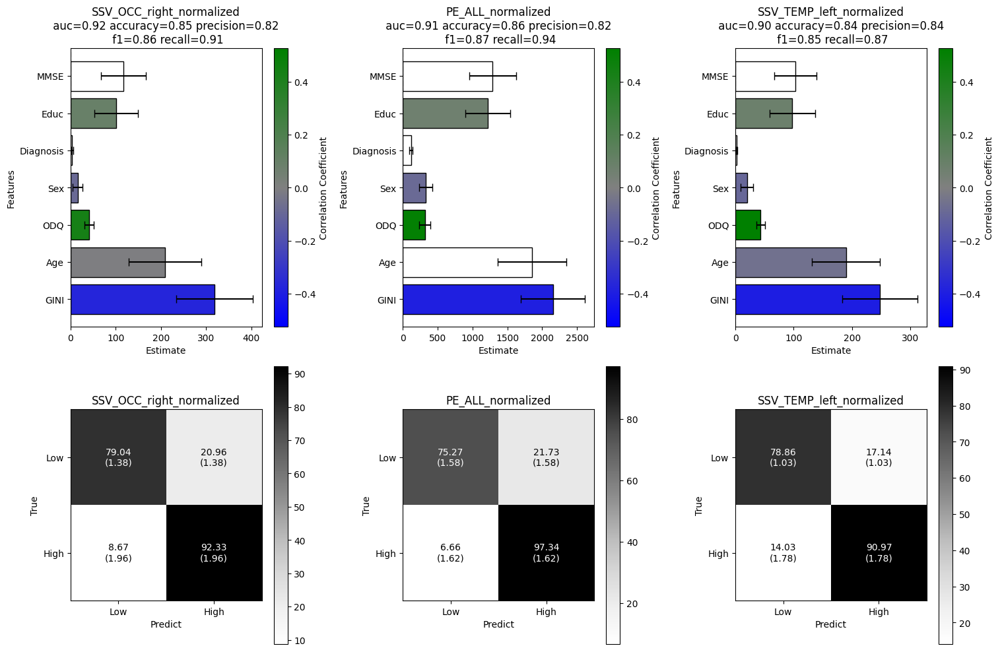

Nuevo inicio de figura, count reiniciado: 1
-> Modelo #0 incluido ✅
7
-> Modelo #1 incluido ✅
7
-> Modelo #2 incluido ✅
7
-> Modelo #3 incluido ✅
7
-> Modelo #4 incluido ✅
7
-> Modelo #5 descartado (menos de 7 features)
-> Modelo #6 incluido ✅
7
-> Modelo #7 incluido ✅
7
-> Modelo #8 incluido ✅
7
-> Modelo #9 descartado (menos de 7 features)
-> Modelo #10 incluido ✅
7
-> Modelo #11 incluido ✅
7
-> Modelo #12 incluido ✅
7
-> Modelo #13 descartado (menos de 7 features)
-> Modelo #14 incluido ✅
7
-> Modelo #15 incluido ✅
7
-> Modelo #16 incluido ✅
7
-> Modelo #17 descartado (menos de 7 features)
-> Modelo #18 descartado (menos de 7 features)
-> Modelo #19 incluido ✅
7
-> Modelo #20 incluido ✅
7
-> Modelo #21 descartado (menos de 7 features)
-> Modelo #22 incluido ✅
7
-> Modelo #23 incluido ✅
7
-> Modelo #24 incluido ✅
7
-> Modelo #25 incluido ✅
7
-> Modelo #26 incluido ✅
7
-> Modelo #27 incluido ✅
7
-> Modelo #28 incluido ✅
7
-> Modelo #29 incluido ✅
7
-> Modelo #30 incluido ✅
7
-> Modelo

/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")
/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


kkk GINI        -213.812500
Age         -100.958333
ODQ           38.416667
Sex          -10.812500
Diagnosis     -2.187500
Educ          61.458333
MMSE          66.458333
dtype: float64
-> Modelo #0 descartado (menos de 7 features)
-> Modelo #1 descartado (menos de 7 features)
-> Modelo #2 descartado (menos de 7 features)
-> Modelo #3 incluido ✅
7
-> Modelo #4 descartado (menos de 7 features)
-> Modelo #5 incluido ✅
7
-> Modelo #6 descartado (menos de 7 features)
-> Modelo #7 descartado (menos de 7 features)
-> Modelo #8 incluido ✅
7
-> Modelo #9 descartado (menos de 7 features)
-> Modelo #10 descartado (menos de 7 features)
-> Modelo #11 descartado (menos de 7 features)
-> Modelo #12 descartado (menos de 7 features)
-> Modelo #13 descartado (menos de 7 features)
-> Modelo #14 descartado (menos de 7 features)
-> Modelo #15 descartado (menos de 7 features)
-> Modelo #16 descartado (menos de 7 features)
-> Modelo #17 incluido ✅
7
-> Modelo #18 descartado (menos de 7 features)
-> Modelo 

/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


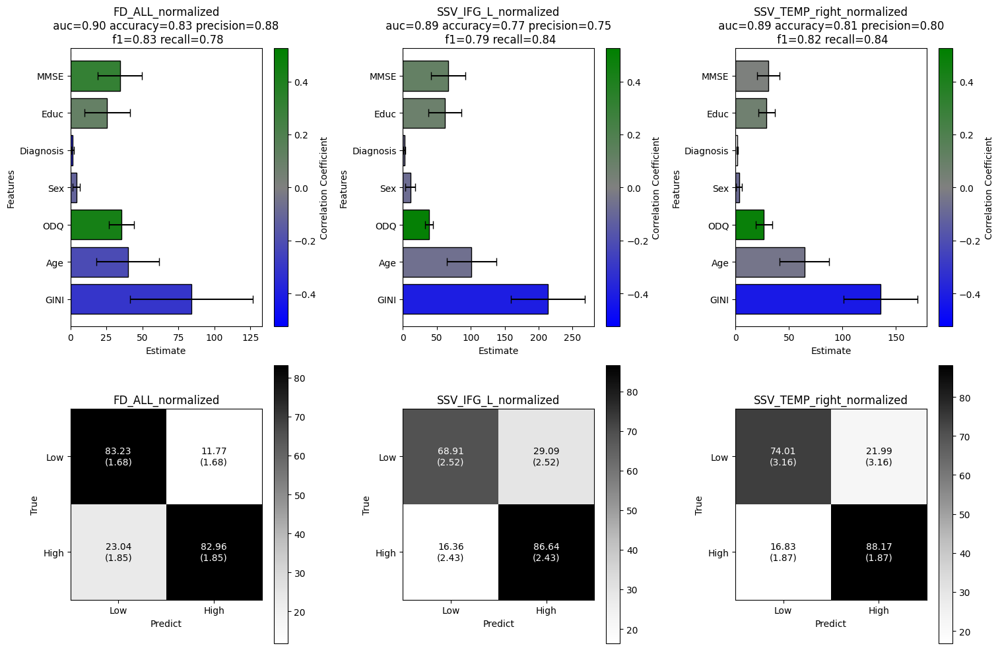

Nuevo inicio de figura, count reiniciado: 1
-> Modelo #0 incluido ✅
7
-> Modelo #1 incluido ✅
7
-> Modelo #2 incluido ✅
7
-> Modelo #3 incluido ✅
7
-> Modelo #4 incluido ✅
7
-> Modelo #5 incluido ✅
7
-> Modelo #6 incluido ✅
7
-> Modelo #7 incluido ✅
7
-> Modelo #8 incluido ✅
7
-> Modelo #9 incluido ✅
7
-> Modelo #10 incluido ✅
7
-> Modelo #11 incluido ✅
7
-> Modelo #12 incluido ✅
7
-> Modelo #13 incluido ✅
7
-> Modelo #14 incluido ✅
7
-> Modelo #15 incluido ✅
7
-> Modelo #16 incluido ✅
7
-> Modelo #17 incluido ✅
7
-> Modelo #18 incluido ✅
7
-> Modelo #19 incluido ✅
7
-> Modelo #20 incluido ✅
7
-> Modelo #21 incluido ✅
7
-> Modelo #22 incluido ✅
7
-> Modelo #23 incluido ✅
7
-> Modelo #24 incluido ✅
7
-> Modelo #25 incluido ✅
7
-> Modelo #26 incluido ✅
7
-> Modelo #27 incluido ✅
7
-> Modelo #28 incluido ✅
7
-> Modelo #29 incluido ✅
7
-> Modelo #30 incluido ✅
7
-> Modelo #31 incluido ✅
7
-> Modelo #32 incluido ✅
7
-> Modelo #33 incluido ✅
7
-> Modelo #34 incluido ✅
7
-> Modelo #35 incluid

/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


Color final para Educ: (np.float64(0.4015686274509804), np.float64(0.5019607843137255), np.float64(0.4015686274509804), np.float64(1.0))
Promedio de correlación correcta para MMSE: nan
Color final para MMSE: white
Color final para MMSE: white
kkk GINI        -57.176471
Age         -20.588235
ODQ          14.823529
Sex          -1.411765
Diagnosis     1.352941
Educ          9.352941
MMSE        -13.588235
dtype: float64


/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


-> Modelo #0 incluido ✅
7
-> Modelo #1 incluido ✅
7
-> Modelo #2 incluido ✅
7
-> Modelo #3 incluido ✅
7
-> Modelo #4 incluido ✅
7
-> Modelo #5 incluido ✅
7
-> Modelo #6 incluido ✅
7
-> Modelo #7 incluido ✅
7
-> Modelo #8 incluido ✅
7
-> Modelo #9 incluido ✅
7
-> Modelo #10 incluido ✅
7
-> Modelo #11 incluido ✅
7
-> Modelo #12 incluido ✅
7
-> Modelo #13 incluido ✅
7
-> Modelo #14 incluido ✅
7
-> Modelo #15 incluido ✅
7
-> Modelo #16 incluido ✅
7
-> Modelo #17 incluido ✅
7
-> Modelo #18 incluido ✅
7
-> Modelo #19 incluido ✅
7
-> Modelo #20 incluido ✅
7
-> Modelo #21 incluido ✅
7
-> Modelo #22 incluido ✅
7
-> Modelo #23 incluido ✅
7
-> Modelo #24 incluido ✅
7
-> Modelo #25 incluido ✅
7
-> Modelo #26 incluido ✅
7
-> Modelo #27 incluido ✅
7
-> Modelo #28 incluido ✅
7
-> Modelo #29 incluido ✅
7
-> Modelo #30 incluido ✅
7
-> Modelo #31 incluido ✅
7
-> Modelo #32 incluido ✅
7
-> Modelo #33 incluido ✅
7
-> Modelo #34 incluido ✅
7
-> Modelo #35 incluido ✅
7
-> Modelo #36 incluido ✅
7
-> Modelo #

/usr/local/lib/python3.12/dist-packages/xlsxwriter/workbook.py:404: UserWarning: Calling close() on already closed file.
  warn("Calling close() on already closed file.")


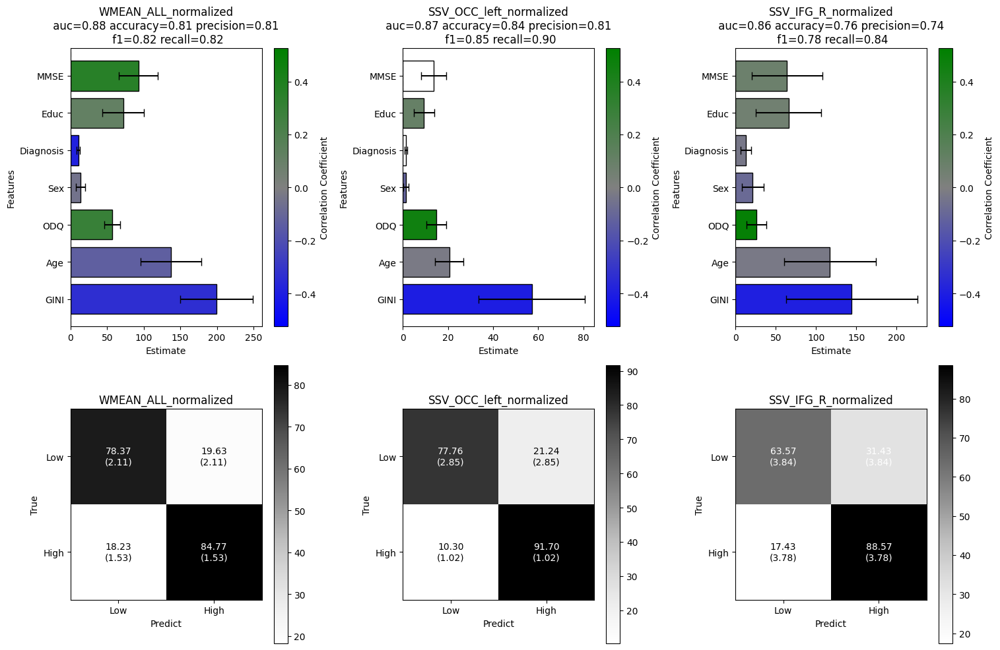

Nuevo inicio de figura, count reiniciado: 1


<Figure size 2000x1000 with 0 Axes>


Predictor Summary Table:
+-------------+-----------+-------------+
| Predictor   |   Correct |   Incorrect |
+=============+===========+=============+
| GINI        |         1 |           0 |
+-------------+-----------+-------------+
| Age         |         1 |           0 |
+-------------+-----------+-------------+
| Sex         |         1 |           0 |
+-------------+-----------+-------------+
| Diagnosis   |         1 |           0 |
+-------------+-----------+-------------+
| Educ        |         1 |           0 |
+-------------+-----------+-------------+
| MMSE        |         1 |           0 |
+-------------+-----------+-------------+
| ODQ         |         1 |           0 |
+-------------+-----------+-------------+


In [ ]:
plt.figure(figsize=(20,10))

graph_feat_impor_t2(df_metrics_dir_2,df_metrics_pval,df_metrics_slopes,df_metrics_correlation,gini_age_results, top_10_keys_GINI_age, gini_plus_var=True, title = '+ Age,Educ,GINI,Sex,MMSE,Diagnosis,ODQ')

In [ ]:
import matplotlib.pyplot as plt
!pip install matplotlib pandas xlsxwriter tabulate
import numpy as np
import pandas as pd
from tabulate import tabulate
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as patches
!pip install pandas
import pandas as pd
!pip install xlsxwriter
import os
import matplotlib.colors as mcolors

def graph_feat_impor_t2(df_metrics_dir, df_metrics_pval, df_metrics_slopes_,df_metrics_correlation_, gini_results_metric, top_10_keys_metric, gini_plus_var=True,  title=''):
    cantidad = 7
    count = 1
    page_number = 1
    ordered_features = ['GINI', 'Age', 'ODQ', 'Sex', 'Diagnosis', 'Educ', 'MMSE']



    variables_expectations = {
      'GINI': 'negative',
      'Age': 'negative',
      'Sex': 'negative',
      'Diagnosis': 'negative',
      'Educ': 'positive',
      'MMSE': 'positive',
      'ODQ': 'positive'
    }


    colors = ['blue', 'gray', 'green']


    nodes = [0.0, 0.5, 1.0]
    custom_cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", list(zip(nodes, colors)))


    summary_df = pd.DataFrame(columns=['Model', 'Correct (%)', 'Incorrect (%)'])
    correct_pred_df = pd.DataFrame(columns=['Model', 'Predictor'])
    incorrect_pred_df = pd.DataFrame(columns=['Model', 'Predictor'])


    normalized_correlations = {}



    global_min = -abs(df_metrics_correlation_.max().max())
    global_max = abs(df_metrics_correlation_.max().max())




    all_feature_outcomes = []


    writer = pd.ExcelWriter(f'{base_path}mugre.xlsx', engine='xlsxwriter')
    writer2 = pd.ExcelWriter(f'{base_path}mugre_.xlsx', engine='xlsxwriter')


    for i, key in enumerate(top_10_keys_metric):
        auc = np.mean(gini_results_metric[key][1]['test']['auc'])
        acc = np.mean(gini_results_metric[key][1]['test']['accuracy_score'])
        prec = np.mean(gini_results_metric[key][1]['test']['precision_score'])
        f1 = np.mean(gini_results_metric[key][1]['test']['f1_score'])
        rec = np.mean(gini_results_metric[key][1]['test']['recall_score'])

        auc_std = np.std(gini_results_metric[key][1]['test']['auc'])
        acc_std = np.std(gini_results_metric[key][1]['test']['accuracy_score'])
        prec_std = np.std(gini_results_metric[key][1]['test']['precision_score'])
        f1_std = np.std(gini_results_metric[key][1]['test']['f1_score'])
        rec_std = np.std(gini_results_metric[key][1]['test']['recall_score'])

        conf_matrix = gini_results_metric[key][1]['test']['confusion_matrix']
        conf_matrix_mean = np.mean(conf_matrix, axis=0)
        conf_matrix_std = np.std(conf_matrix, axis=0)

        fscore = {k: [] for k in ['GINI', 'Age', 'Educ', 'Sex', 'MMSE', 'ODQ', 'Diagnosis']}
        model_idx = 0
        model_summary = []





        for model in gini_results_metric[key][1]['test']['model']:


                model_fscore = model.get_fscore()


                model_features = list(model_fscore.keys())


                if gini_plus_var and len(model_features) < cantidad:
                    status = "Descartado"
                    print(f"-> Modelo #{model_idx} descartado (menos de {cantidad} features)")
                    model_idx += 1

                    model_summary.append({
                        "Key": key,
                        "Modelo": model_idx - 1,
                        "Estado": status,
                        "Cantidad_features": len(model_features),
                        "Features": ", ".join(model_features)
                    })
                    continue

                else:
                    status = "Incluido"
                    print(f"-> Modelo #{model_idx} incluido ✅")

                    for j in model_fscore.keys():
                        if gini_plus_var and len(model_fscore.keys()) < cantidad:
                            continue
                        if j in fscore:
                            fscore[j].append(model_fscore[j])
                        else:
                            fscore[j] = [model_fscore[j]]

                print(len(fscore))


                model_summary.append({
                    "Key": key,
                    "Modelo": model_idx,
                    "Estado": status,
                    "Cantidad_features": len(model_features),
                    "Features": ", ".join(model_features)
                })
                model_idx += 1


        df_models = pd.DataFrame(model_summary)

        df_models.to_excel(writer, sheet_name=str(key), index=False)


        index = ['Age', 'Educ', 'GINI', 'Sex', 'MMSE', 'ODQ', 'Diagnosis']

        feature_outcome = {feature: {'Correct': 0, 'Incorrect': 0} for feature in index}

        df = pd.DataFrame.from_dict(fscore, orient='index')
        df = df.transpose()

        if df.empty:
          print("joda")
          continue

        for column in index:
            if column not in df.columns:
                df[column] = 0

        df[ordered_features] = df[ordered_features].fillna(0)

        plt.subplot(2, 4, count)
        mean_values = df.mean()
        std_values = df.std()




        if df_metrics_dir is not None:
            mean_values_filtered = mean_values.copy()
            for feature in mean_values.index:
                if feature in df_metrics_dir.index and key in df_metrics_dir.columns:
                    pval = df_metrics_pval.loc[feature, key]

                    mean_values_filtered[feature] = mean_values.get(feature, 1) * np.sign(df_metrics_dir.loc[feature, key])


            mean_values_filtered = mean_values_filtered.fillna(0)
            std_values = std_values.loc[mean_values_filtered.index]


            mean_values_filtered = mean_values_filtered.loc[ordered_features]
            std_values = std_values.loc[ordered_features]


            correlation_series = df_metrics_correlation_.loc[ordered_features, key]
            slope_series = df_metrics_slopes_.loc[ordered_features, key]


            correlation_values = []
            df_metrics_slopes_values = []

            for feature in ordered_features:
                correlation_str = correlation_series.loc[feature]
                slope_str = slope_series.loc[feature]




                if isinstance(correlation_str, (int, float, np.floating)):
                    correlation_str = str(correlation_str).replace("–", "-")


                if isinstance(slope_str, bytes):
                    slope_str = slope_str.decode('utf-8')

                try:
                    if isinstance(correlation_str, str):
                      print(f"Valor antes de procesar: {correlation_str}")
                      correlation_str = correlation_str.replace("–", "-")
                      correlation_value = extraer_valor_numerico_(correlation_str)
                      print(f"Después de extraer: {correlation_value}")



                    correlation_value = extraer_valor_numerico_(correlation_str)
                    slope_value = extraer_valor_numerico(slope_str)
                except ValueError:
                    correlation_value = None
                    slope_value = None


                correlation_values.append(correlation_value)
                df_metrics_slopes_values.append(slope_value)



                if pd.notna(correlation_value):
                    correlation_value = round(correlation_value, 6)

                    if correlation_value > 1:

                        correlation_value = 1


                        correlation_value = 1
                    elif correlation_value < -1:

                        correlation_value = -1




                        correlation_value = -1

                        correlation_values.append(correlation_value)
                        df_metrics_slopes_values.append(slope_value if pd.notna(slope_value) else None)
                else:

                    df_metrics_slopes_values.append(None)
                    correlation_values.append(None)



            valid_correlations = [val for val in correlation_values if val is not None]


            color_list = ['green' if val > 0 else 'blue' if val < 0 else 'red' for val in mean_values_filtered]



            colors = [(0.5, 0, 0), (1, 1, 1), (1, 0.2, 0.2)]
            nodes = [0.0, 0.5, 1.0]
            red_cmap = mcolors.LinearSegmentedColormap.from_list("red_cmap", list(zip(nodes, colors)))


            ax = plt.subplot(2, 4, count)


            correlation_min = -1
            correlation_max = 1
            norm = plt.Normalize(correlation_min, correlation_max)
            sm = plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm)
            sm.set_array([])


            red_norm = plt.Normalize(-1, 1)
            red_sm = plt.cm.ScalarMappable(cmap=red_cmap, norm=red_norm)
            red_sm.set_array([])


            for feature, correlation_value in zip(mean_values_filtered.index, correlation_values):
                    print(f"Métrica: {key}, Característica: {feature}, Correlación: {correlation_value}")


            negative_blue = set()
            positive_green = set()

            # Definir expectativas de las variables
            variables_expectations = {
                'GINI': 'negative',
                'Age': 'negative',
                'Sex': 'negative',
                'Diagnosis': 'negative',
                'Educ': 'positive',
                'MMSE': 'positive',
                'ODQ': 'positive'
            }

            for feature, correlation_value,slope in zip(mean_values_filtered.index, correlation_values,df_metrics_slopes_values):
                        print(f"Métrica: {key}, Característica: {feature}, Correlación: {correlation_value}, Pendiente:{slope}" )


            incorrect_counts = {feature: 0 for feature in mean_values_filtered.index}

            correlation_per_feature = {feature: [] for feature in mean_values_filtered.index}

            for feature, value, error in zip(mean_values_filtered.index, mean_values_filtered.values, std_values.values):

                idx = mean_values_filtered.index.get_loc(feature)
                correlation_value = correlation_values[idx]
                df_metrics_slopes_value = df_metrics_slopes_values[idx]



                print(f"Procesando: {feature}, Valor: {value}, Error: {error}, Correlación: {correlation_value}, Slopewwww: {df_metrics_slopes_value}")

                expectation = variables_expectations.get(feature, None)  # Usar la expectativa general o 'negative' por defecto
                # Clasificación
                if expectation == 'positive':
                    positive_green.add(feature)
                else:
                    negative_blue.add(feature)




                # Clasificación
                if expectation == 'positive':
                    positive_green.add(feature)
                else:
                    negative_blue.add(feature)




                ####Acomplex
                negative_blue = {'GINI', 'Age', 'Sex', 'Diagnosis'}
                positive_green = {'Educ', 'MMSE','ODQ'}
                colors = []



                print(f"Procesandoooooo: {feature}, Expectativa: {expectation}, Valor de correlación: {correlation_value}")


                correctos = []
                incorrectos = []
                aux = 0
                aux2 = 0




                epsilon = 1e-6

                try:
                  df_metrics_slopes_value = float(df_metrics_slopes_value)
                except ValueError:
                  df_metrics_slopes_value = np.nan

                if correlation_value is not None and not np.isnan(df_metrics_slopes_value):

                    if (expectation == 'positive' and df_metrics_slopes_value > 0) or \
                       (expectation == 'negative' and df_metrics_slopes_value < 0):
                         correlation_per_feature[feature].append(correlation_value)
                         feature_outcome[feature]['Correct'] += 1
                    else:
                         feature_outcome[feature]['Incorrect'] += 1




                feature_outcome_df = pd.DataFrame.from_dict(feature_outcome, orient='index').reset_index()
                feature_outcome_df.rename(columns={'index': 'Feature'}, inplace=True)


                feature_outcome_df['Model'] = key


                all_feature_outcomes.append(feature_outcome_df)



            all_avg_corrs = [np.mean(correlation_per_feature[f]) for f in correlation_per_feature if correlation_per_feature[f]]


            abs_max = max(abs(np.nanmin(all_avg_corrs)), abs(np.nanmax(all_avg_corrs)))

            correlation_min = -abs_max
            correlation_max = abs_max

            norm = plt.Normalize(global_min, global_max)
            sm = plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm)
            sm.set_array([])


            for feature in mean_values_filtered.index:
                avg_correct_corr = np.mean(correlation_per_feature[feature]) if correlation_per_feature[feature] else np.nan


                if not np.isnan(avg_correct_corr):
                    color = sm.to_rgba(avg_correct_corr)
                else:
                    color = 'white'



                plt.barh(feature, abs(mean_values_filtered[feature]), xerr=std_values[feature], capsize=4, color=color, align='center', edgecolor='black')


            plt.colorbar(sm, ax=plt.gca(), label='Correlation Coefficient')



        ax = plt.gca()
        ax.set_xlim(left=0)#


        writer.close()

        plt.axvline(x=0, color='black', linestyle='--')
        plt.ylabel('Features')
        plt.xlabel('Estimate')
        plt.title(f'{key}\n auc={auc:.2f} accuracy={acc:.2f} precision={prec:.2f} \n f1={f1:.2f} recall={rec:.2f}')

        plt.subplot(2, 4, count + 4)
        plt.imshow(conf_matrix_mean, interpolation='nearest', cmap=plt.cm.Greys)
        plt.title(f'{key}')
        plt.colorbar()

        tick_marks = np.arange(len(['Low', 'High']))
        plt.xticks(tick_marks, ['Low', 'High'])
        plt.yticks(tick_marks, ['Low', 'High'])
        plt.ylabel('True')
        plt.xlabel('Predict')

        for row in range(conf_matrix_mean.shape[0]):
            for col in range(conf_matrix_mean.shape[1]):
                plt.text(col, row, f"{conf_matrix_mean[row, col]:.2f}\n({conf_matrix_std[row, col]:.2f})",
                         ha="center", va="center", color="white" if conf_matrix_mean[row, col] > 30 else "black")
         visible_features = [
            feature for feature in mean_values_filtered.index
            if not np.isnan(mean_values_filtered[feature])
        ]


        correct_visible_features = [
            feature for feature in visible_features
            if (feature in positive_green and mean_values_filtered[feature] > 0) or
               (feature in negative_blue and mean_values_filtered[feature] < 0)
        ]


        incorrect_visible_features = [
            feature for feature in visible_features
            if (feature in positive_green and mean_values_filtered[feature] < 0) or
               (feature in negative_blue and mean_values_filtered[feature] > 0)
        ]


        correct_visible_count = len(correct_visible_features)
        incorrect_visible_count = len(incorrect_visible_features)

        total_visible_count = correct_visible_count + incorrect_visible_count
        correct_visible_pct = (correct_visible_count / total_visible_count * 100) if total_visible_count > 0 else 0
        incorrect_visible_pct = (incorrect_visible_count / total_visible_count * 100) if total_visible_count > 0 else 0


        summary_df = pd.concat([summary_df,
                               pd.DataFrame({
                                   'Model': [key],
                                   'Correct (Blue)': [len([feature for feature in correct_visible_features if feature in negative_blue])],
                                   'Incorrect (Blue)': [len([feature for feature in incorrect_visible_features if feature in negative_blue])],
                                   'Correct (Orange)': [len([feature for feature in correct_visible_features if feature in positive_green])],
                                   'Incorrect (Orange)': [len([feature for feature in incorrect_visible_features if feature in positive_green])],
                                   'Correct (%)': [correct_visible_pct],
                                   'Incorrect (%)': [incorrect_visible_pct]
                               })
                              ],ignore_index=True)

        for feature in correct_visible_features:
            correct_pred_df = pd.concat([correct_pred_df, pd.DataFrame([{'Model': key, 'Predictor': feature}])], ignore_index=True)
        for feature in incorrect_visible_features:
            incorrect_pred_df = pd.concat([incorrect_pred_df, pd.DataFrame([{'Model': key, 'Predictor': feature}])], ignore_index=True)
      count += 1


        metrics = {
            'AUC': [auc, auc_std],
            'Accuracy': [acc, acc_std],
            'Precision': [prec, prec_std],
            'F1 Score': [f1, f1_std],
            'Recall': [rec, rec_std]
        }
        df_metrics = pd.DataFrame(metrics, index=['Mean', 'STD'])

        mean_fscore = df.mean()
        std_fscore = df.std()
        fscores_ = pd.DataFrame({'mean': mean_fscore, 'SD': std_fscore})

        df_conf_m = pd.DataFrame(conf_matrix_mean, index=['Low', 'High'], columns=['Low', 'High'])
        df_conf_s = pd.DataFrame(conf_matrix_std, index=['Low', 'High'], columns=['Low', 'High'])

        with pd.ExcelWriter(f'{base_path}/conect_GINI_{title}_rank_{count - 1}_{key}.xlsx', engine='xlsxwriter') as writer:
            df_metrics.to_excel(writer, sheet_name='metrics')
            fscores_.to_excel(writer, sheet_name='fscores')
            df_conf_m.to_excel(writer, sheet_name='conf_mat_mean')
            df_conf_s.to_excel(writer, sheet_name='conf_mat_std')

        if count % 4 == 0  or (i == len(top_10_keys_metric) - 1):
          plt.tight_layout()
          plt.savefig(f'{base_path}figure_{title}_page_{i//4 + 1}.pdf', format='pdf')
          plt.savefig(f'{base_path}figure_{title}_page_{i//4 + 1}.svg', format='svg')
          plt.show()
          plt.figure(figsize=(20, 10))
          count = 1



    plt.tight_layout()

    plt.savefig(f'{base_path}figure_{title}_.svg', format='svg', facecolor='white')
    plt.savefig(f'{base_path}figure_{title}_.pdf', format='pdf', facecolor='white')

    plt.show()
    plt.close()


    predictor_summary = {predictor: {'Correct': 0, 'Incorrect': 0} for predictor in variables_expectations.keys()}


    for feature in mean_values_filtered.index:
        correlation_value = correlation_values[mean_values_filtered.index.get_loc(feature)]
        expectation = variables_expectations.get(feature, None)

        if expectation:
            if (expectation == 'positive' and correlation_value >= 0) or (expectation == 'negative' and correlation_value <= 0):
                predictor_summary[feature]['Correct'] += 1
            else:
                predictor_summary[feature]['Incorrect'] += 1


    predictor_summary_df = pd.DataFrame.from_dict(predictor_summary, orient='index').reset_index()
    predictor_summary_df.rename(columns={'index': 'Predictor'}, inplace=True)


    with pd.ExcelWriter(f'{base_path}summary_{title}.xlsx', engine='xlsxwriter') as writer:
        summary_df.to_excel(writer, sheet_name='summary', index=False)
        correct_pred_df.to_excel(writer, sheet_name='correct_predictors', index=False)
        incorrect_pred_df.to_excel(writer, sheet_name='incorrect_predictors', index=False)
        predictor_summary_df.to_excel(writer, sheet_name='predictor_summary', index=False)


    print("\nPredictor Summary Table:")
    print(tabulate(predictor_summary_df, headers='keys', tablefmt='grid', showindex=False))



In [ ]:
import re

def extraer_valor_numerico(s):

    if isinstance(s, bytes):
        s = s.decode('utf-8')

    s = str(s).replace("–", "-")


    match = re.search(r"([-+]?\d*\.\d+|\d+)", s)

    if match:

        return float(match.group(0))
    else:

        return None


In [ ]:
def extraer_valor_numerico_(s):
    if isinstance(s, bytes):
        s = s.decode("utf-8")


    s = str(s).replace("–", "-").strip()

    try:
        valor = float(s)
        return valor
    except ValueError:

        return None

In [ ]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt


import pickle
with open(f'{base_path}df_metrics_slopes_todo_.pkl', 'rb') as f:
    df_metrics_slopes_todo_ = pickle.load(f)

!pip install xlsxwriter


df_metrics_slopes_todo_
print(df_metrics_slopes_todo_.head())
print(df_metrics_slopes_todo_.columns)
print(df_metrics_slopes_todo_.index)

df_expandido = df_metrics_slopes_todo_.apply(lambda x: x.explode())
df_expandido.reset_index(inplace=True)

print(df_expandido.head())
with pd.ExcelWriter(f'{base_path}modelos_por_predictor.xlsx', engine="xlsxwriter") as writer:
    for predictor in df_expandido["index"].unique():


df_expandido = df_expandido.apply(pd.to_numeric, errors="ignore")


expected_directions = {
    'GINI': 'negative',
    'Age': 'negative',
    'Sex': 'negative',
    'Diagnosis': 'negative',
    'Educ': 'positive',
    'MMSE': 'positive',
    'ODQ': 'positive'
}


df_expandido = pd.read_excel(f'{base_path}modelos_por_predictor.xlsx', sheet_name=None)


resultados_por_feature = {}

for predictor, df in df_expandido.items():
    print(f"🔹 Procesando predictor: {predictor}")

    for col in df.columns[1:]:
        if col not in resultados_por_feature:
            resultados_por_feature[col] = pd.DataFrame(columns=["Predictor", "Modelos_correctos", "Total_modelos", "Modelos_incorrectos", "Porcentaje_correctos", "Porcentaje_incorrectos"])

        direction_match_counts = 0
        total_models_considerados = min(len(df), 70)

        for _, row in df.head(70).iterrows():
            feature = row["index"]
            slope_str = row[col]

            try:
                slope_match = re.findall(r'[-+]?\d*\.\d+', str(slope_str))
                slope_val = float(slope_match[0]) if slope_match else None
            except ValueError:
                slope_val = None

            if slope_val is not None:
                expected = expected_directions.get(feature, None)
                if expected == 'positive' and slope_val > 0:
                    direction_match_counts += 1
                elif expected == 'negative' and slope_val < 0:
                    direction_match_counts += 1


        modelos_correctos = direction_match_counts
        modelos_incorrectos = total_models_considerados - modelos_correctos
        porcentaje_correctos = (modelos_correctos / total_models_considerados) * 100 if total_models_considerados > 0 else 0
        porcentaje_incorrectos = (modelos_incorrectos / total_models_considerados) * 100 if total_models_considerados > 0 else 0

        nuevo_df = pd.DataFrame([{
            "Predictor": predictor,
            "Modelos_correctos": modelos_correctos,
            "Total_modelos": total_models_considerados,
            "Modelos_incorrectos": modelos_incorrectos,
            "Porcentaje_correctos": porcentaje_correctos,
            "Porcentaje_incorrectos": porcentaje_incorrectos
        }])

        resultados_por_feature[col] = pd.concat([resultados_por_feature[col], nuevo_df], ignore_index=True)


with pd.ExcelWriter(f'{base_path}porcentajes_correctos_por_feature.xlsx', engine="xlsxwriter") as writer:
    for feature, df_resultados in resultados_por_feature.items():
        df_resultados.to_excel(writer, sheet_name=feature, index=False)


        features = df_resultados["Predictor"].tolist()
        accuracy_percentages = df_resultados["Porcentaje_correctos"].values
        incorrect_percentages = df_resultados["Porcentaje_incorrectos"].values


        accuracy_percentages = np.append(accuracy_percentages, accuracy_percentages[0])
        incorrect_percentages = np.append(incorrect_percentages, incorrect_percentages[0])

        num_vars = len(features)
        angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
        angles += angles[:1]


        fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
        ax.fill(angles, accuracy_percentages, color='blue', alpha=0.3)
        ax.plot(angles, accuracy_percentages, color='blue', linewidth=2, linestyle='solid')


        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(features, fontsize=10)
        ax.set_ylim(0, 100)


        plt.savefig(f'{base_path}/{feature}_polar.svg', format="svg", dpi=300)
        plt.close()


                                   SSV_IFG_L_normalized  \
GINI  [-0.8174691594844179, -0.7892186141620698, -0....   
Age   [-0.13525770607164475, -0.06119060084008895, -...   
Educ  [0.31214507986009266, 0.3032413794868782, 0.20...   
Sex   [-0.1620255945515463, -0.1673165998425517, -0....   
MMSE  [0.26259405778471967, 0.13775070945364973, 0.0...   

                                   SSV_IFG_R_normalized  \
GINI  [-0.8316303942037298, -0.7440444706746543, -0....   
Age   [0.055454855863524895, 0.07686420087368663, 0....   
Educ  [0.11658902857297865, 0.10280196006658703, 0.0...   
Sex   [-0.16202559455154633, -0.168762930008605, -0....   
MMSE  [0.017738578010147624, -0.10678244961768112, -...   

                               SSV_TEMP_left_normalized  \
GINI  [-0.8696156181601036, -0.8262516391946161, -0....   
Age   [-0.08736814657800962, -0.051423909368267025, ...   
Educ  [0.24203614847251084, 0.24080593787889273, 0.1...   
Sex   [-0.1947236410904234, -0.21539334688123637, -0..

/tmp/ipython-input-2822953.py:30: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df_expandido = df_expandido.apply(pd.to_numeric, errors="ignore")  # 🔹 Convierte números correctamente
/tmp/ipython-input-2822953.py:93: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  resultados_por_feature[col] = pd.concat([resultados_por_feature[col], nuevo_df], ignore_index=True)
/tmp/ipython-input-2822953.py:93: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, 

🔹 Procesando predictor: Educ
🔹 Procesando predictor: Sex
🔹 Procesando predictor: MMSE
🔹 Procesando predictor: Diagnosis
🔹 Procesando predictor: ODQ
✅ Archivo 'porcentajes_correctos_por_feature.xlsx' generado correctamente con pestañas por feature y gráficos.
